31 high activity passes are not that much but still somewhat useful

['GRBALPHA_20241018T110034', 'GRBALPHA_20241017T224535', 'GRBALPHA_20241018T001903', 'GRBALPHA_20241101T092751', 'GRBALPHA_20241019T214126', 'GRBALPHA_20241029T003018', 'GRBALPHA_20241028T225645', 'GRBALPHA_20241028T083709', 'GRBALPHA_20241028T100958', 'GRBALPHA_20241020T224123', 'GRBALPHA_20241031T005632', 'GRBALPHA_20241030T090242', 'GRBALPHA_20241030T103630', 'GRBALPHA_20241030T232232', 'GRBALPHA_20241031T082932', 'GRBALPHA_20241027T000340', 'GRBALPHA_20241026T223029', 'GRBALPHA_20241019T102657', 'GRBALPHA_20241019T085324', 'GRBALPHA_20241018T221326', 'GRBALPHA_20241018T234627', 'GRBALPHA_20241102T231327', 'GRBALPHA_20241103T004713', 'GRBALPHA_20241102T102726', 'GRBALPHA_20241102T085402', 'GRBALPHA_20241017T082528', 'GRBALPHA_20241024T105037', 'GRBALPHA_20241027T233012', 'GRBALPHA_20241023T094901', 'GRBALPHA_20241022T230911', 'GRBALPHA_20241025T230331']
31
File GRBALPHA_20241031T005632_pickled.bin not found. Skipping.
BAM shape: (29, 9, 3205) (files, features, time)


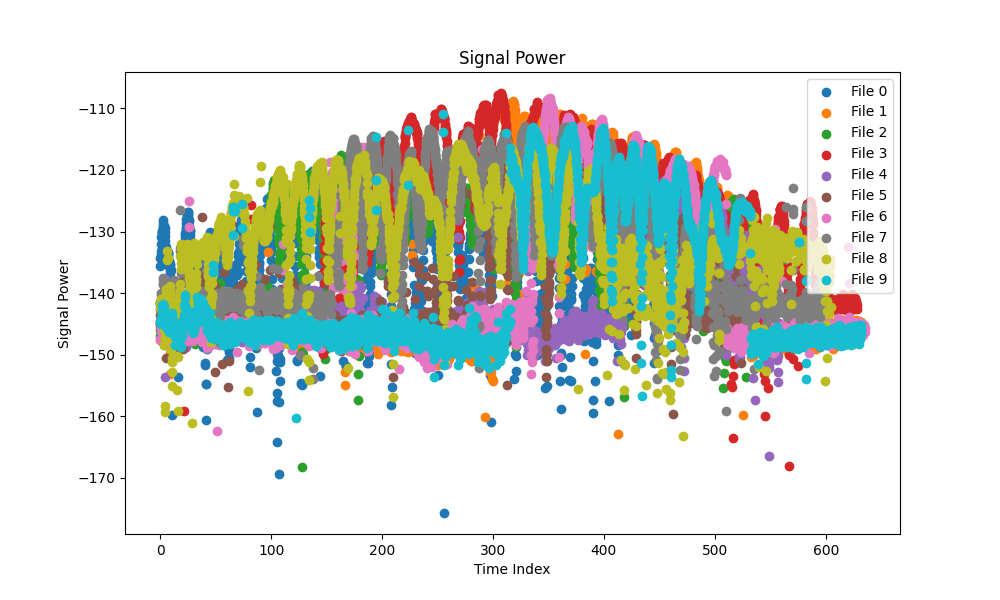

In [1]:
%matplotlib widget
import matplotlib.pyplot as plt
import noisy_moose as nm  # Ensure noisy_moose is installed
import json
import pickle
import numpy as np

# Define paths
data_path = 'C:/Users/StoreElberg/OneDrive - Aalborg Universitet/Git3/output/'  # Update path as needed
label_path = 'C:/Users/StoreElberg/OneDrive - Aalborg Universitet/Git3/Data-Pre/new_labels.json'

# Load labels
labels = json.loads(open(label_path).read())
file = [f for f in labels['3'] if f.startswith('GRBALPHA')]  # Filter files starting with 'GRBALPHA'
print(file)
print(len(file))

def calculate_pointing_error(set_azimuth, set_elevation, azimuth, elevation):
    """
    Calculate the pointing error given reference (set) and measured azimuth and elevation.
    
    Parameters:
        set_azimuth (array-like): Reference azimuth values in degrees.
        set_elevation (array-like): Reference elevation values in degrees.
        azimuth (array-like): Measured azimuth values in degrees.
        elevation (array-like): Measured elevation values in degrees.
    
    Returns:
        np.ndarray: Pointing error for each pair of reference and measured angles in degrees.
    """
    # Convert degrees to radians
    set_azimuth_rad = np.radians(set_azimuth)
    set_elevation_rad = np.radians(set_elevation)
    azimuth_rad = np.radians(azimuth)
    elevation_rad = np.radians(elevation)
    
    # Compute the pointing error using the great-circle distance formula
    pointing_error_rad = np.arccos(
        np.sin(set_elevation_rad) * np.sin(elevation_rad) +
        np.cos(set_elevation_rad) * np.cos(elevation_rad) * np.cos(azimuth_rad - set_azimuth_rad)
    )
    
    # Convert the pointing error back to degrees
    pointing_error_deg = np.degrees(pointing_error_rad)
    return pointing_error_deg

def unpickle(file):
    """Unpickles the given file from data_path."""
    try:
        with open(data_path + file + "_pickled.bin", 'rb') as f:
            dump = f.read()
        return pickle.loads(dump)
    except FileNotFoundError:
        print(f"File {file + '_pickled.bin'} not found. Skipping.")
        return None

def extract_features(prop_obj):
    """Extract multiple features from the given object."""
    if prop_obj is None:
        return None  # Skip if object is None

    # Calculate features
    pointing_error = calculate_pointing_error(
        prop_obj.station_obj.set_azimuth, 
        prop_obj.station_obj.set_elevation, 
        prop_obj.station_obj.azimuth, 
        prop_obj.station_obj.elevation
    )
    corrected_power = 10 * np.log10(prop_obj.noise_obj.signal_abs) - prop_obj.station_obj.fspl

    # Features
    features = [
        prop_obj.noise_obj.time,           # Time (0)
        prop_obj.noise_obj.signal_abs,     # Signal Power (1)
        prop_obj.station_obj.fspl,         # FSPL (2)
        prop_obj.station_obj.dist,         # Distance (3)
        prop_obj.station_obj.set_azimuth,  # Target azimuth (4)
        prop_obj.station_obj.set_elevation,# Target elevation (5)
        pointing_error,                    # Pointing error (6)
        prop_obj.noise_obj.noise,          # Noise power in W/Hz (7)
        corrected_power,                   # FSPL corrected signal power (8)
    ]

    # Find the maximum length
    max_length = max(len(feature) for feature in features)

    # Pad all features to the maximum length
    padded_features = [
        np.pad(feature, (0, max_length - len(feature)), constant_values=np.nan)
        for feature in features
    ]

    # Stack features column-wise
    return np.vstack(padded_features)


# Collect and process data
data_list = []
for f in file[:30]:  # Go through all files
    data: nm.prepping = unpickle(f)
    if data is not None:
        features = extract_features(data)
        if features is not None:
            data_list.append(features)

# Determine maximum length for padding
max_length = max(features.shape[1] for features in data_list)

# Pad the data for each file
padded_data = [
    np.pad(features, ((0, 0), (0, max_length - features.shape[1])), constant_values=np.nan) #all the ones which are not long enough are padded with nan, not ZERO or interpolated.
    for features in data_list
]

# Convert to a 3D numpy array: (file index, feature index, time index)
BAM = np.array(padded_data, dtype=np.float32)
print(f"BAM shape: {BAM.shape} (files, features, time)")

# Plot the first feature (e.g., signal power) for all files
plt.figure(figsize=(10, 6))
# for i in range(BAM.shape[0]):
for i in range(10):
    plt.scatter(BAM[i, 0], 10*np.log10(BAM[i, 1]), label=f'File {i}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Time Index')
plt.ylabel('Signal Power')
plt.title('Signal Power')
plt.legend()
plt.show()



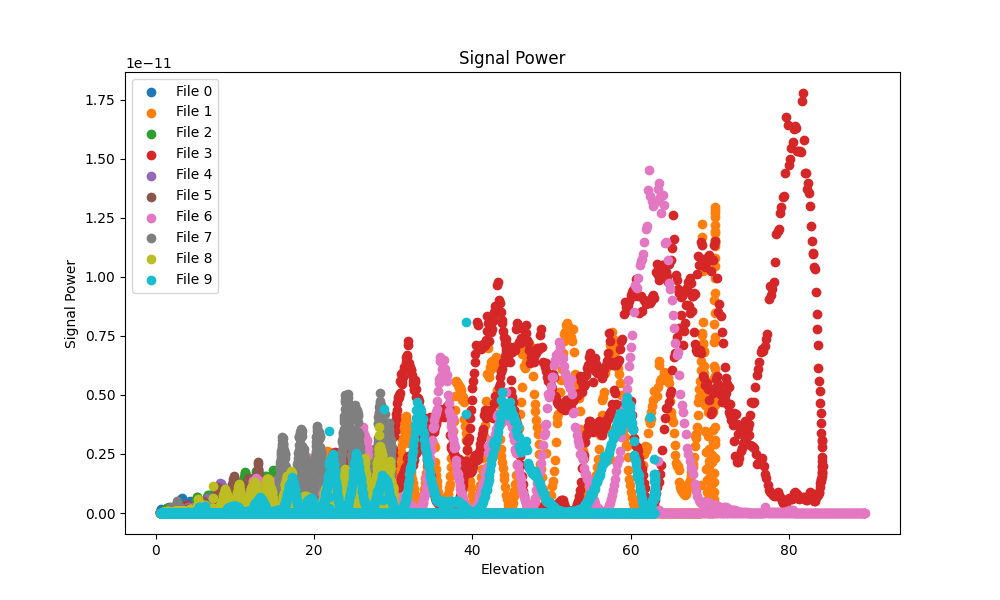

In [3]:
# Plot the first feature (e.g., signal power) for all files
plt.figure(figsize=(10, 6))
# for i in range(BAM.shape[0]):
for i in range(10):
    plt.scatter(BAM[i, 5], BAM[i, 1], label=f'File {i}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Elevation')
plt.ylabel('Signal Power')
plt.title('Signal Power')
plt.legend()
plt.show()

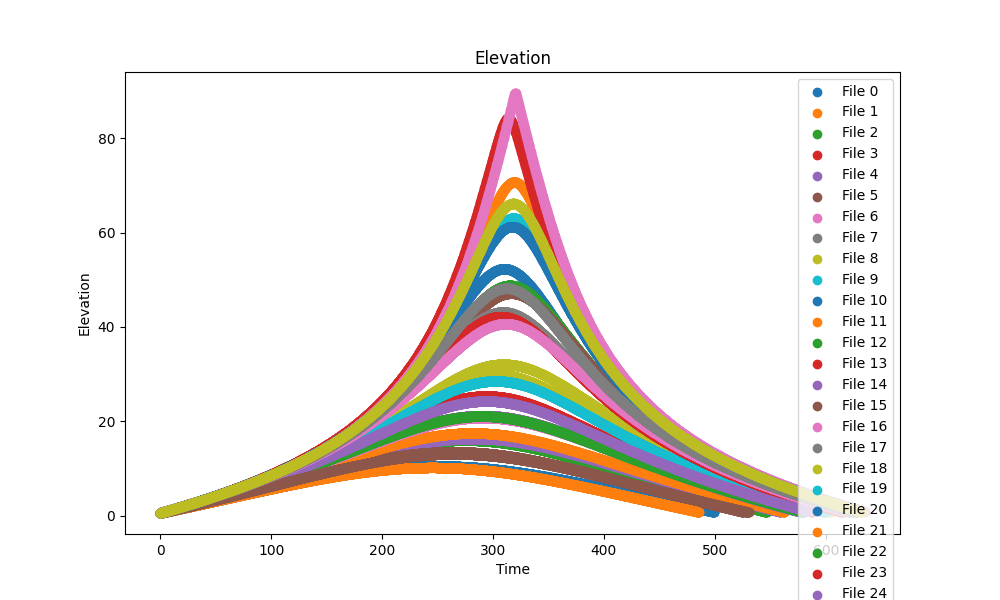

In [4]:
# Plot the first feature (e.g., signal power) for all files
plt.figure(figsize=(10, 6))
# for i in range(BAM.shape[0]):
for i in range(29):
    plt.scatter(BAM[i, 0], BAM[i, 5], label=f'File {i}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Time')
plt.ylabel('Elevation')
plt.title('Elevation')
plt.legend()
plt.show()

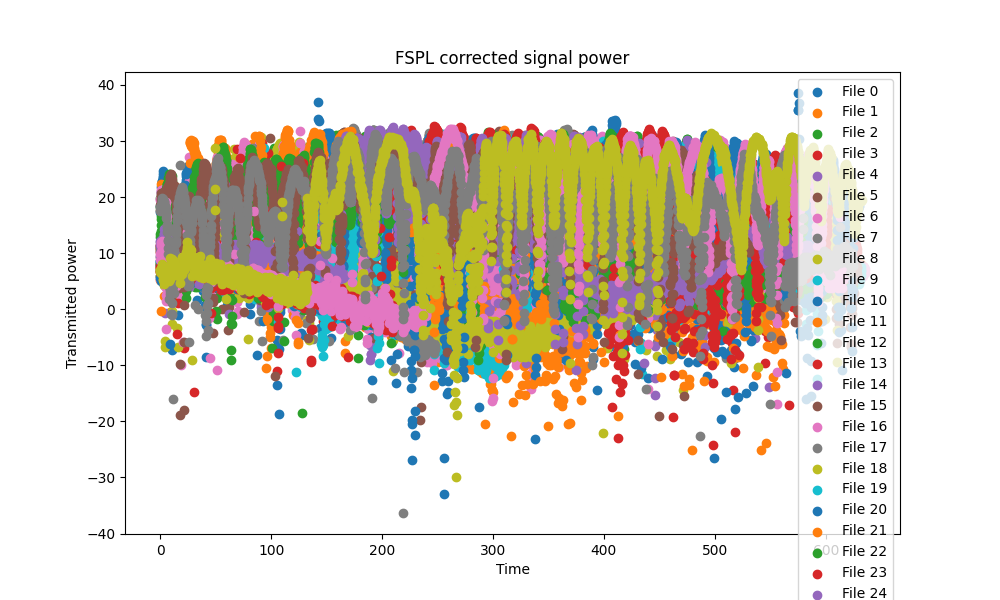

In [5]:
# Plot the first feature (e.g., signal power) for all files
plt.figure(figsize=(10, 6))
# for i in range(BAM.shape[0]):
for i in range(29):
    plt.scatter(BAM[i, 0], BAM[i, 8], label=f'File {i}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Time')
plt.ylabel('Transmitted power')
plt.title('FSPL corrected signal power')
plt.legend()
plt.show()

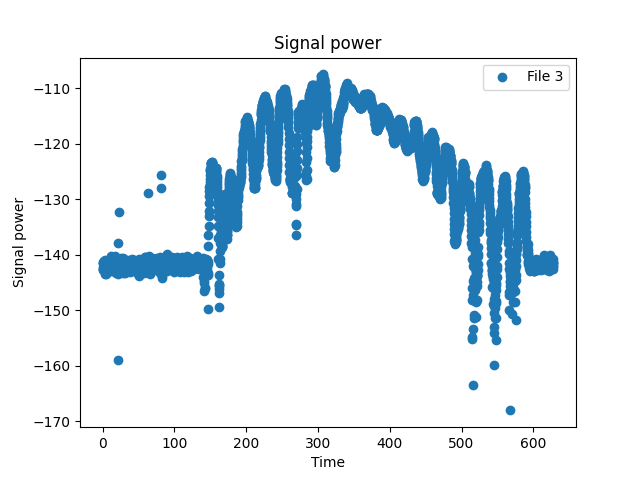

In [6]:
plt.figure()
plt.scatter(BAM[3, 0], 10*np.log10(BAM[3, 1]), label=f'File {3}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Time')
plt.ylabel('Signal power')
plt.title('Signal power')
plt.legend()
plt.show()

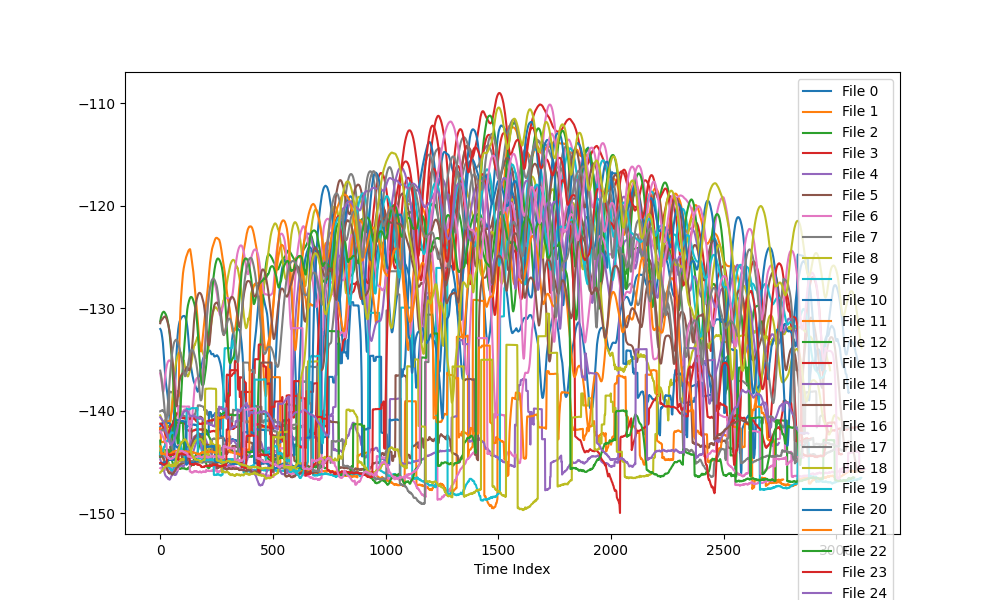

MOVBAM shape: (29, 3156)
[[6.26643301e-14 6.22551036e-14 6.16409421e-14 ...            nan
             nan            nan]
 [3.67600608e-15 3.68964645e-15 3.68323610e-15 ...            nan
             nan            nan]
 [3.51746777e-15 3.56084489e-15 3.62012658e-15 ...            nan
             nan            nan]
 ...
 [6.30781773e-15 6.31052040e-15 6.29259170e-15 ...            nan
             nan            nan]
 [2.46026017e-14 2.40329215e-14 2.33525961e-14 ...            nan
             nan            nan]
 [2.48543233e-15 2.48468965e-15 2.51072248e-15 ...            nan
             nan            nan]]
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]


In [18]:
# MOVBAM=np.convolve(BAM[:,1,:], np.ones(50)/50, mode='valid') #moving average of the signal power
plt.figure(figsize=(10, 6))
MOVBAM = []  # Initialize as an empty list
for i in range(BAM.shape[0]):
    # Compute moving average of the signal power
    moving_avg = np.convolve(BAM[i, 1, :], np.ones(50)/50, mode='valid')
    MOVBAM.append(moving_avg)  # Append the result to the list
    plt.plot(10*np.log10(moving_avg), label=f'File {i}')

plt.xlabel('Time Index')
plt.legend()
plt.show()
# Convert MOVBAM to a numpy array for easier manipulation
MOVBAM = np.array(MOVBAM)

# Print the shape of MOVBAM
print(f"MOVBAM shape: {MOVBAM.shape}")
print(MOVBAM)
mask = MOVBAM[:,:] < 10**(-130/10)
print(mask)


# Threshold analysis

In [14]:
threshold=10**(-138/10) #-138dBm
print(threshold)
for file_idx in range(BAM.shape[0]):
    signal_power = BAM[file_idx, 1, :]  # Signal power is at feature index 1

    # Identify time indices where signal power is below the threshold
    mask = signal_power < threshold

    # Set all features at these time indices to NaN for the current file
    BAM[file_idx, :, mask] = np.nan


1.584893192461111e-14


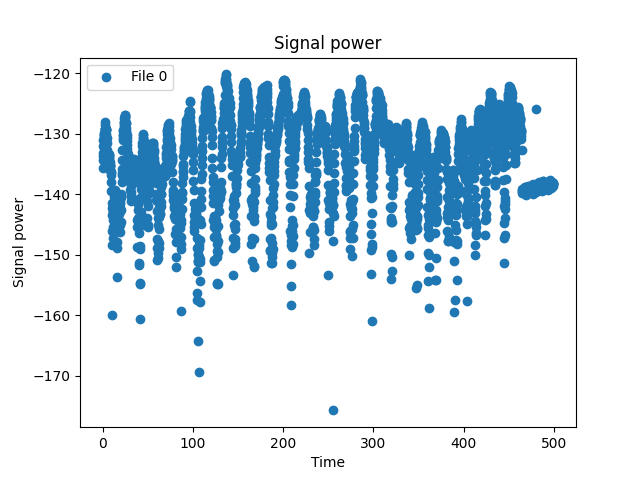

In [84]:
n=0
plt.figure()
plt.scatter(BAM[n, 0], 10*np.log10(BAM[n, 1]), label=f'File {n}')  # Plot Feature 2 (Signal Power)
plt.xlabel('Time')
plt.ylabel('Signal power')
plt.title('Signal power')
plt.legend()
plt.show()

# Histogram

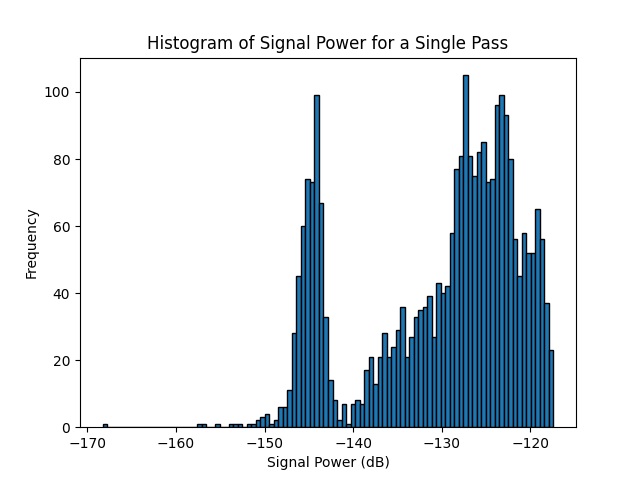

In [137]:
n=2
plt.figure()
plt.hist(10 * np.log10(BAM[n, 1, :]), bins=100, edgecolor='black')
plt.xlabel('Signal Power (dB)')
plt.ylabel('Frequency')
plt.title('Histogram of Signal Power for a Single Pass')
plt.show()

We just need some ML to choose the minimum point

In [11]:
from sklearn.cluster import KMeans
import numpy as np

# Flatten the signal power data
signal_power = BAM[:, 1, :].flatten()  # Assuming BAM contains signal power in the 2nd feature

# Reshape for clustering
signal_power_reshaped = signal_power.reshape(-1, 1)

# Apply K-Means clustering with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(signal_power_reshaped)

# Get cluster assignments and cluster centers
clusters = kmeans.labels_
cluster_centers = kmeans.cluster_centers_.flatten()

# Assign classes based on cluster means
non_transmitting_label = np.argmin(cluster_centers)  # Cluster with the lowest mean
transmitting_label = np.argmax(cluster_centers)     # Cluster with the highest mean

# Replace cluster labels with actual class labels
labels = np.where(clusters == non_transmitting_label, 0, 1)

# Optional: Visualize the clustering
import matplotlib.pyplot as plt

plt.hist(signal_power[labels == 0], bins=50, alpha=0.6, label='Non-Transmitting', color='orange')
plt.hist(signal_power[labels == 1], bins=50, alpha=0.6, label='Transmitting', color='blue')
plt.axvline(cluster_centers[non_transmitting_label], color='red', linestyle='--', label='Non-Transmitting Mean')
plt.axvline(cluster_centers[transmitting_label], color='green', linestyle='--', label='Transmitting Mean')
plt.xlabel('Signal Power (dB)')
plt.ylabel('Frequency')
plt.legend()
plt.title('Clustering of Transmitting and Non-Transmitting')
plt.show()


ValueError: Input X contains NaN.
KMeans does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

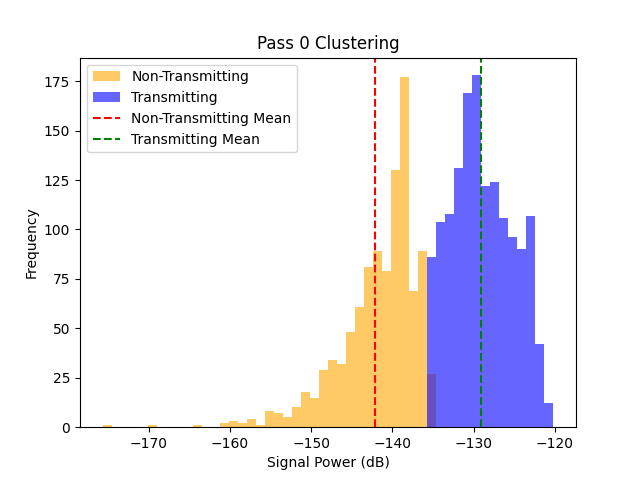

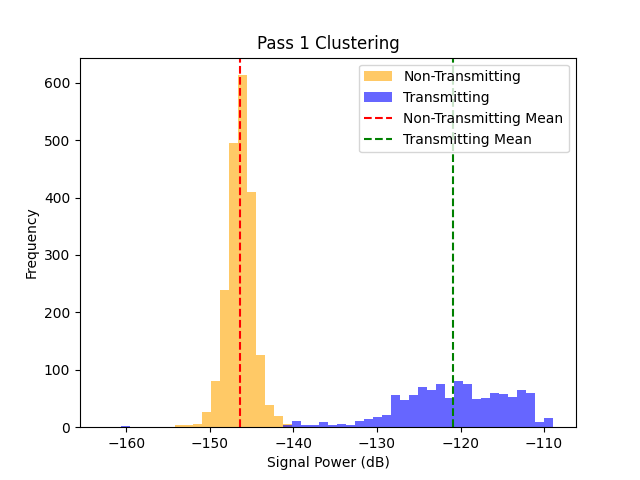

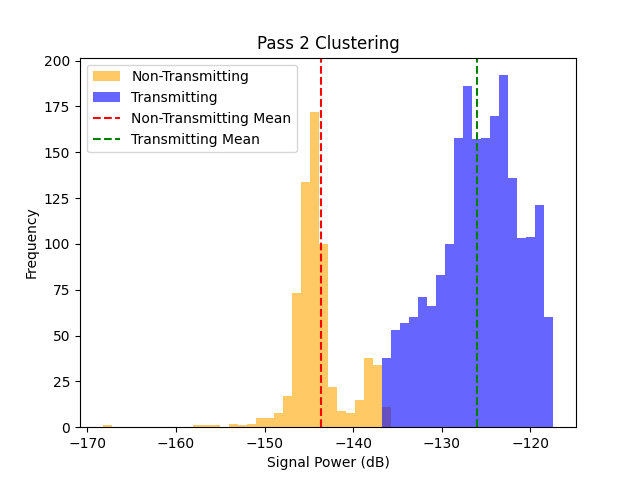

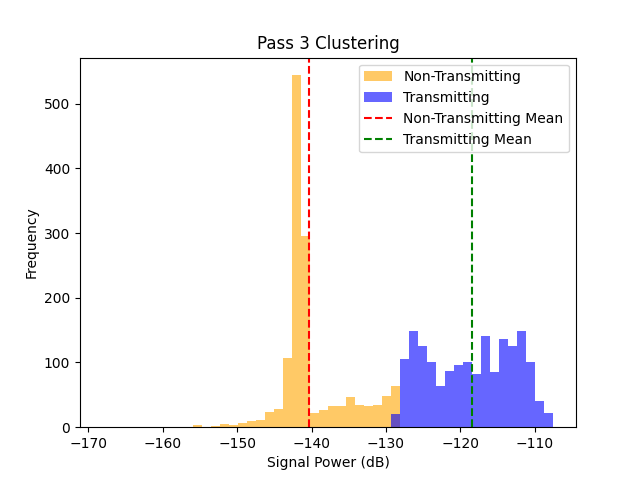

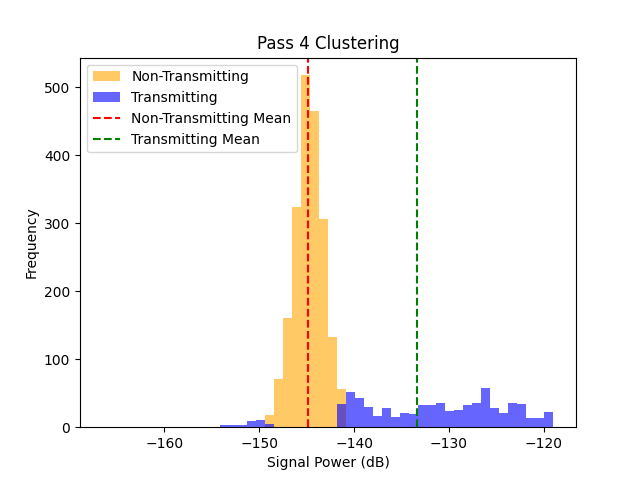

...

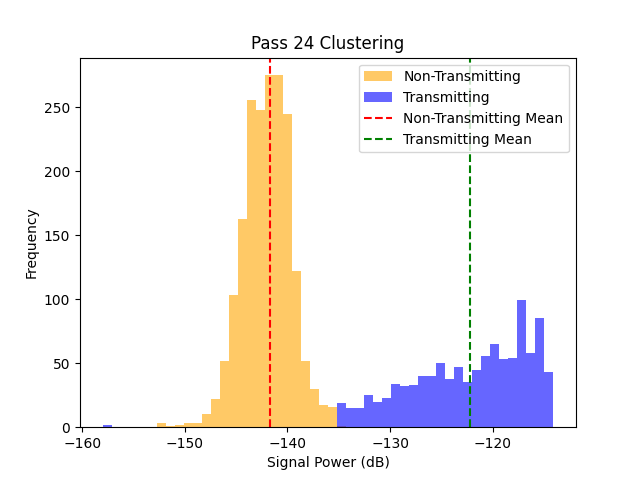

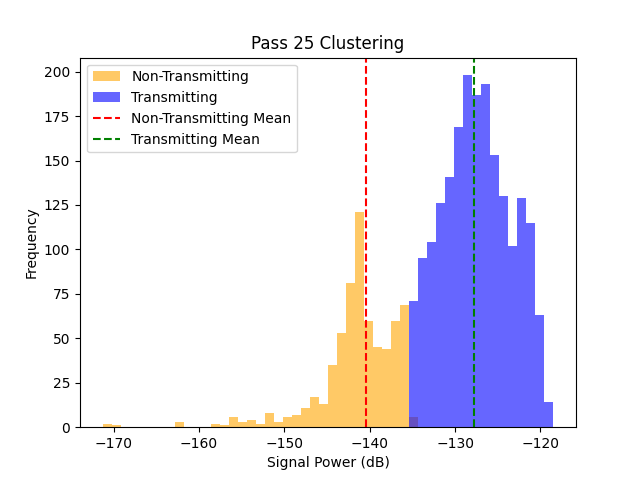

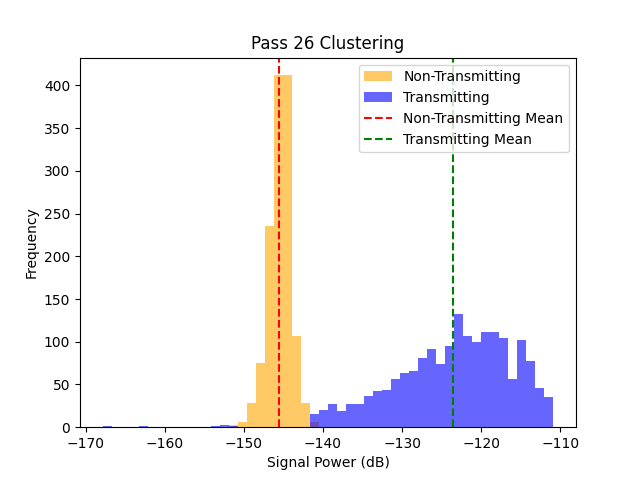

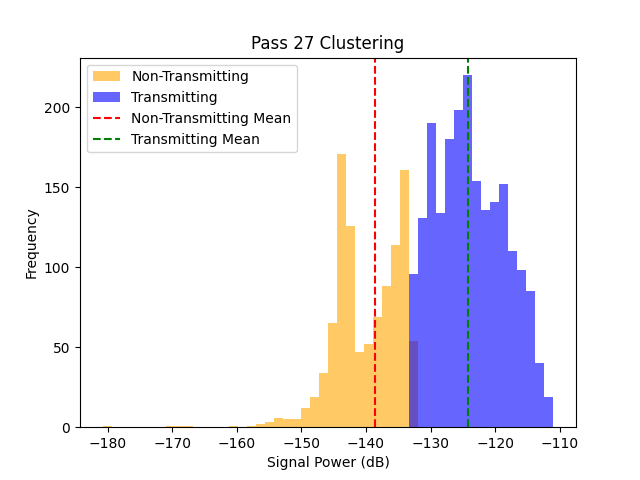

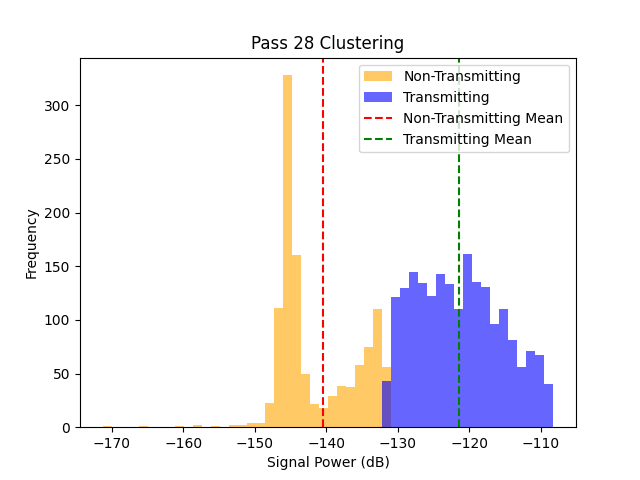

[{'pass': 0, 'labels': array([0, 1, 1, ..., 0, 0, 0]), 'means': array([[-129.0915052 ],
       [-142.08529674]]), 'non_transmitting_label': 1, 'transmitting_label': 0}, {'pass': 1, 'labels': array([0, 0, 0, ..., 0, 0, 0]), 'means': array([[-146.43576329],
       [-120.86238081]]), 'non_transmitting_label': 0, 'transmitting_label': 1}, {'pass': 2, 'labels': array([0, 0, 0, ..., 1, 1, 1]), 'means': array([[-126.00427241],
       [-143.65579538]]), 'non_transmitting_label': 1, 'transmitting_label': 0}, {'pass': 3, 'labels': array([0, 0, 0, ..., 0, 0, 0]), 'means': array([[-118.49936228],
       [-140.31359963]]), 'non_transmitting_label': 1, 'transmitting_label': 0}, {'pass': 4, 'labels': array([0, 0, 0, ..., 0, 0, 0]), 'means': array([[-144.80723061],
       [-133.34591199]]), 'non_transmitting_label': 0, 'transmitting_label': 1}, {'pass': 5, 'labels': array([0, 0, 0, ..., 0, 0, 0]), 'means': array([[-144.89625324],
       [-129.51426171]]), 'non_transmitting_label': 0, 'transmitting_lab

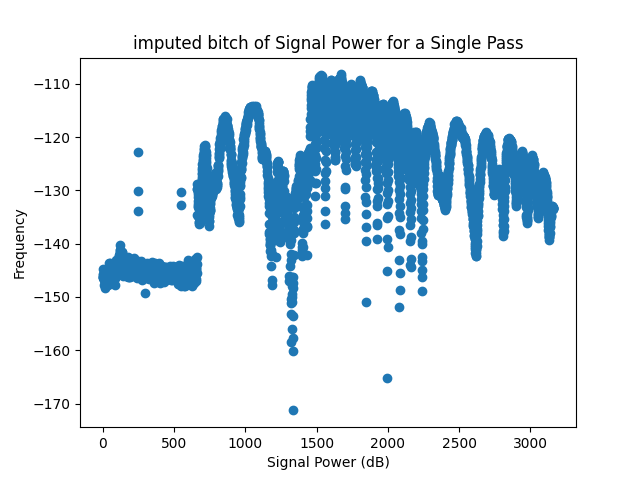

In [12]:
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Example: BAM shape (passes, features, time)
n_passes = BAM.shape[0]  # Number of passes
results = []  # To store labels per pass

for i in range(n_passes):
    # Extract signal power for the current pass
    signal_power = 10*np.log10(BAM[i, 1, :])  # Assuming feature 1 is signal power
    
    # Handle missing values (e.g., NaN imputation)
    imputer = SimpleImputer(strategy='most_frequent')
    signal_power_imputed = imputer.fit_transform(signal_power.reshape(-1, 1)).flatten()
    
    # Apply clustering (e.g., K-Means or GMM)
    # Define initial precision matrices for two components (scalars for univariate data)
    precision_1 = np.array([[0.4]])  # Precision matrix for component 1 (1x1 matrix)
    precision_2 = np.array([[1.0]])  # Precision matrix for component 2 (1x1 matrix)

    # Stack the precision matrices into a 3D array of shape (n_components, n_features, n_features)
    precisions_init = np.array([precision_1, precision_2])
    gmm = GaussianMixture(n_components=2,precisions_init=precisions_init, random_state=42)
    clusters= gmm.fit_predict(signal_power_imputed.reshape(-1, 1))
    
    # Get cluster assignments and means
    # clusters = gmm.predict(signal_power_imputed.reshape(-1, 1))
    # print(clusters)
    means = gmm.means_
    # print(means)
    # print("GMM Converged:", gmm.converged_)
    
    
    # Assign classes based on cluster means
    non_transmitting_label = np.argmin(means)  # Cluster with the lowest mean
    transmitting_label = np.argmax(means)     # Cluster with the highest mean
    
    # Replace cluster labels with actual class labels
    labels = np.where(clusters == non_transmitting_label, 0, 1)
    
    # Store results for this pass
    results.append({
        "pass": i,
        "labels": labels,
        "means": means,
        "non_transmitting_label": non_transmitting_label,
        "transmitting_label": transmitting_label
    })
    
    # Find the minimum and maximum values across both groups
    min_val = min(signal_power_imputed[labels == 0].min(), signal_power_imputed[labels == 1].min())
    max_val = max(signal_power_imputed[labels == 0].max(), signal_power_imputed[labels == 1].max())

    # Set the number of bins
    bins = 50
    # print(min_val, max_val)

    # Create equally spaced bins across the entire range of the data
    bin_edges = np.linspace(min_val, max_val, bins + 1)
    # Optional: Visualize the clustering for this pass
    plt.figure()
    plt.hist(signal_power[labels == 0], bins=bin_edges, alpha=0.6, label='Non-Transmitting', color='orange')
    plt.hist(signal_power[labels == 1], bins=bin_edges, alpha=0.6, label='Transmitting', color='blue')
    plt.axvline(means[non_transmitting_label], color='red', linestyle='--', label='Non-Transmitting Mean')
    plt.axvline(means[transmitting_label], color='green', linestyle='--', label='Transmitting Mean')
    plt.title(f'Pass {i} Clustering')
    plt.xlabel('Signal Power (dB)')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

print(results)
plt.figure()
plt.scatter(np.arange(len(BAM[28,1])),10*np.log10(BAM[28,1]))
plt.xlabel('Signal Power (dB)')
plt.ylabel('Frequency')
plt.title('imputed bitch of Signal Power for a Single Pass')
plt.show()


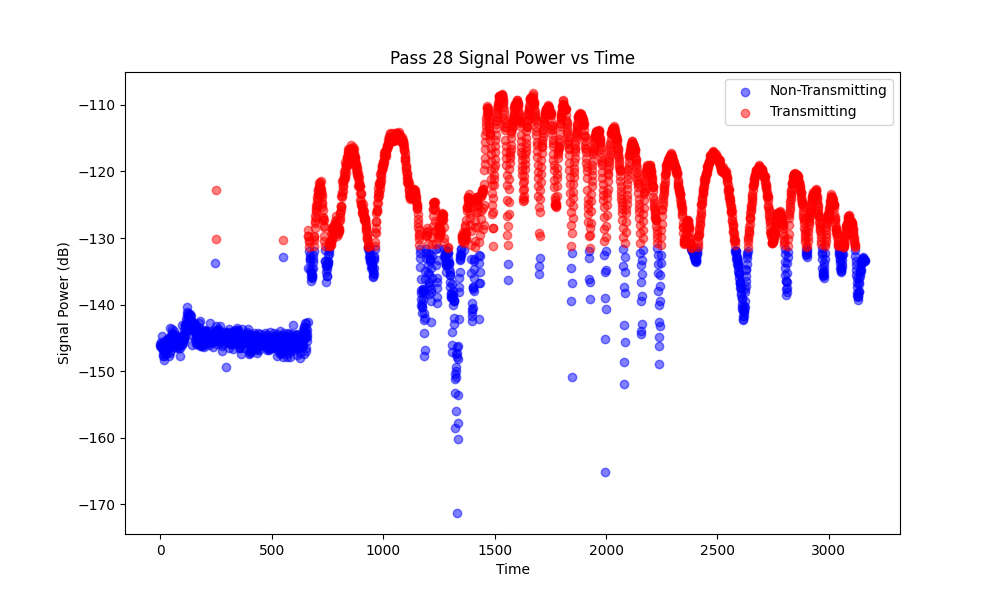

In [184]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming BAM is shaped (files, features, time)
# Pass index (for example, we want to visualize pass 0)
pass_index = 28

# Extract the signal power (feature 1, corresponding to BAM[pass_index, 1, :])
signal_power = 10*np.log10(BAM[pass_index, 1, :])

# Extract the cluster labels for the pass (e.g., from your GMM result)
labels = results[pass_index]['labels']  # Assuming result is the output of fit_predict for each pass

# Define non-transmitting and transmitting labels based on your result
non_transmitting_label = results[pass_index]['non_transmitting_label']
transmitting_label = results[pass_index]['transmitting_label']

# Plot signal power with different colors for transmitting and non-transmitting points
plt.figure(figsize=(10, 6))

# Non-transmitting points (label 0 or 1 depending on the result)
plt.scatter(np.where(labels == non_transmitting_label), signal_power[labels == non_transmitting_label],
            label='Non-Transmitting', color='blue', alpha=0.5)

# Transmitting points (label 1 or 0 depending on the result)
plt.scatter(np.where(labels == transmitting_label), signal_power[labels == transmitting_label],
            label='Transmitting', color='red', alpha=0.5)

# Add labels, title, and legend
plt.xlabel('Time')
plt.ylabel('Signal Power (dB)')
plt.title(f'Pass {pass_index} Signal Power vs Time')
plt.legend()

# Show the plot
plt.show()


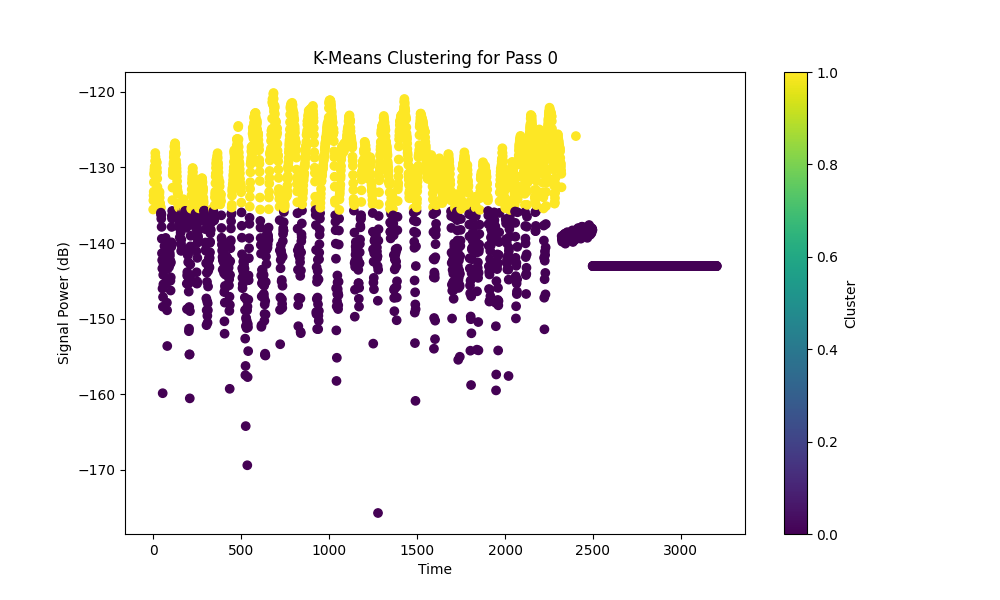

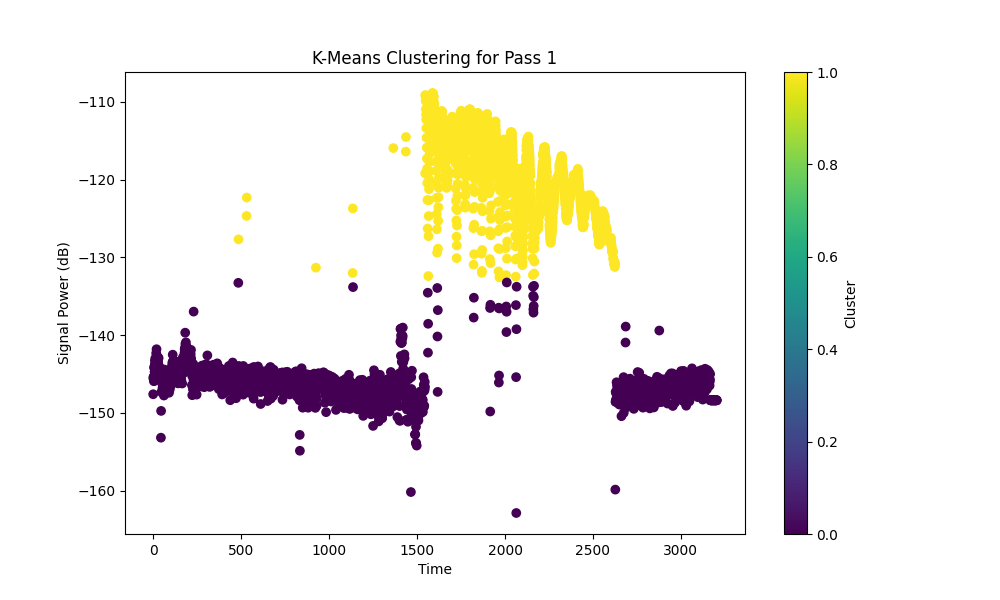

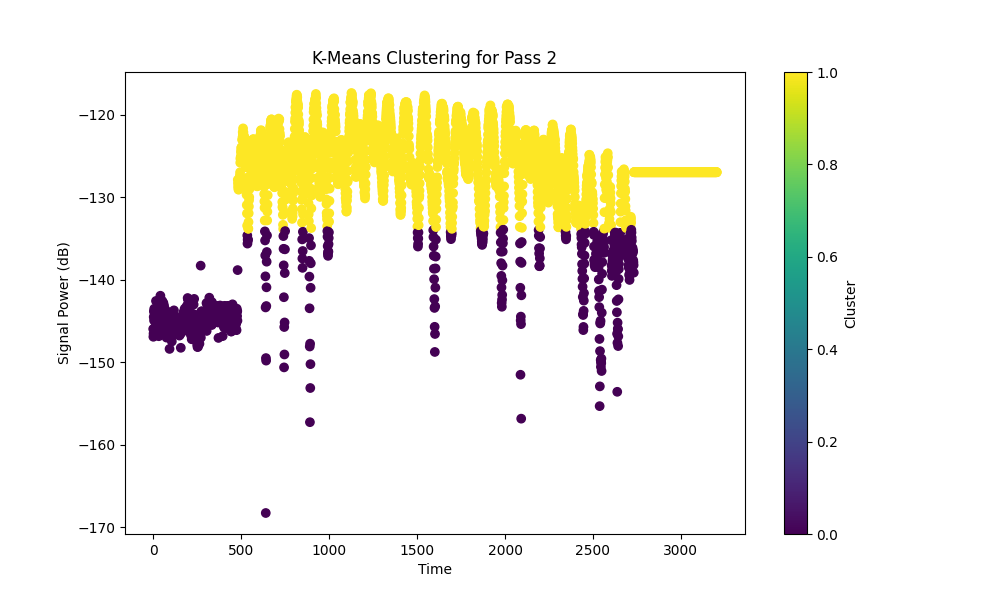

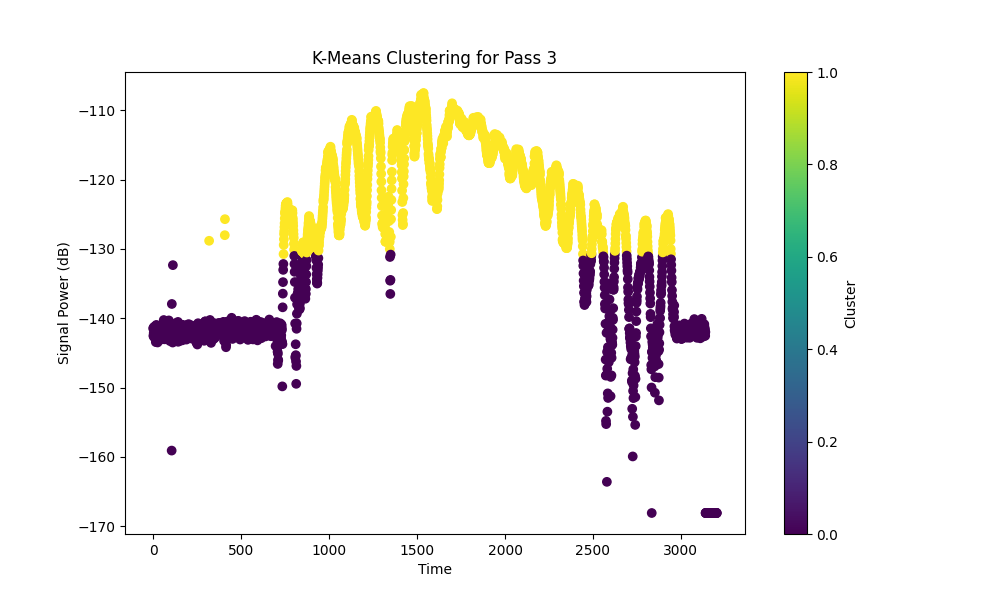

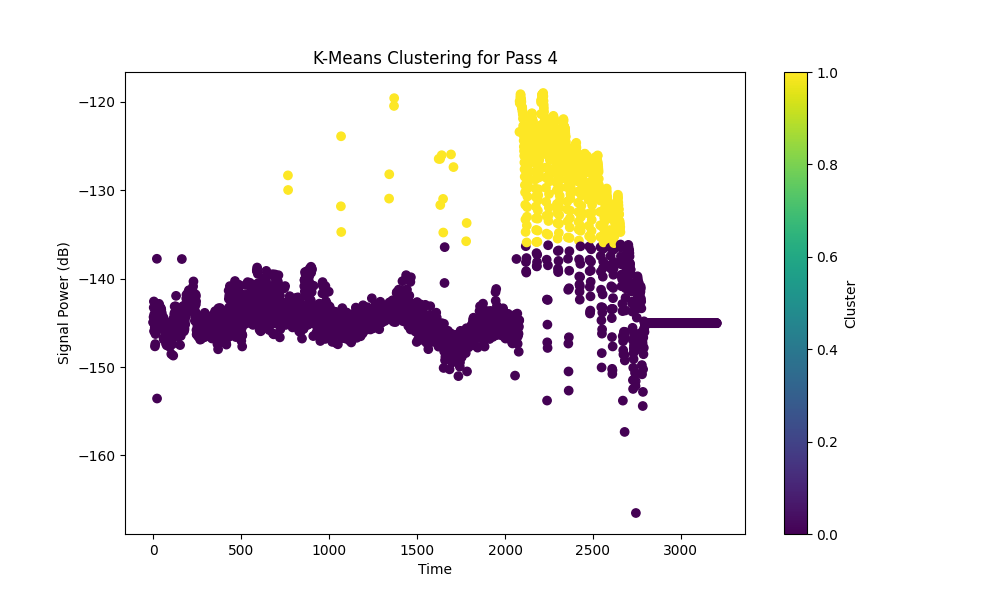

...

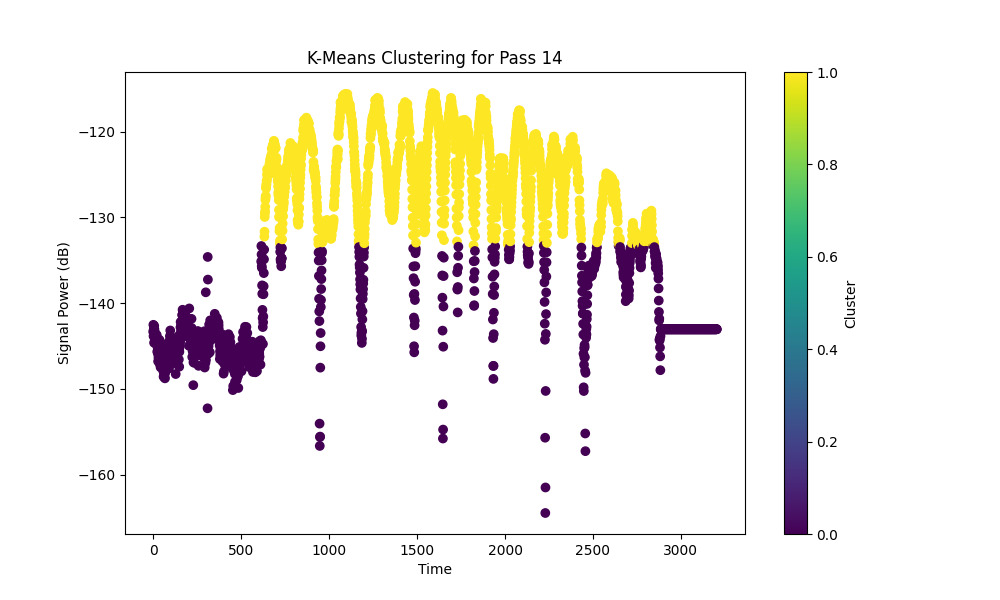

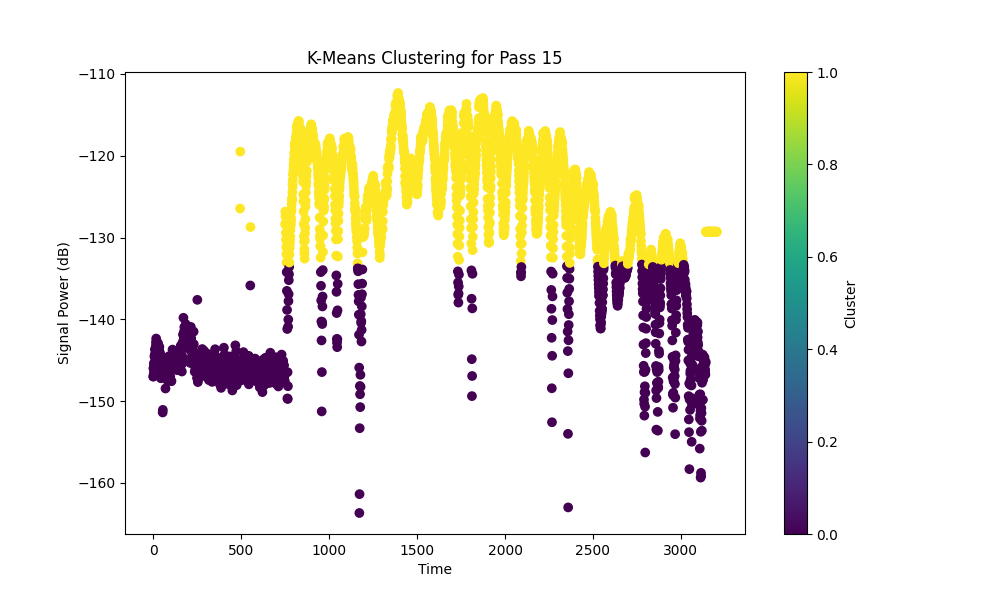

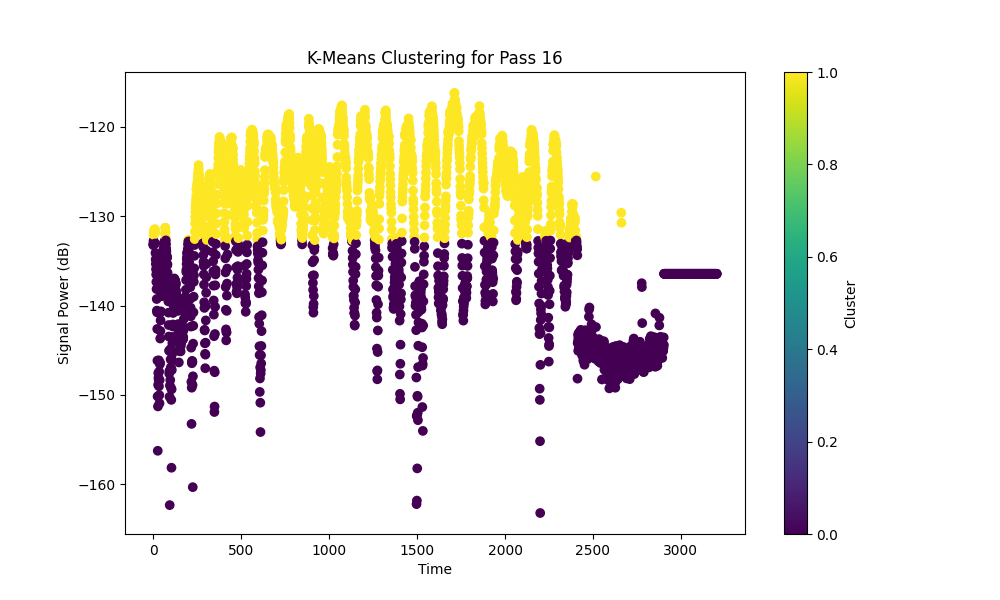

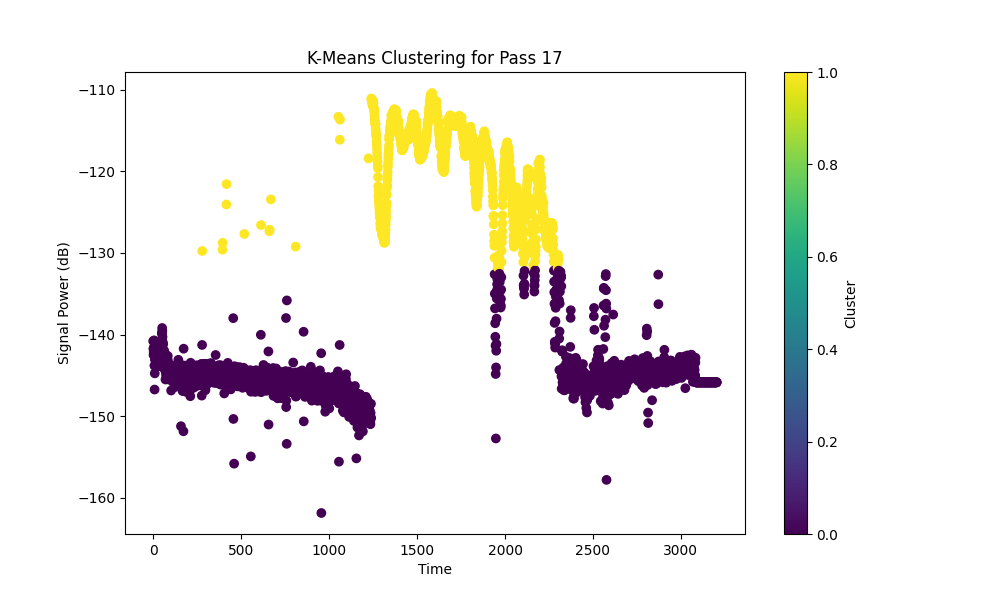

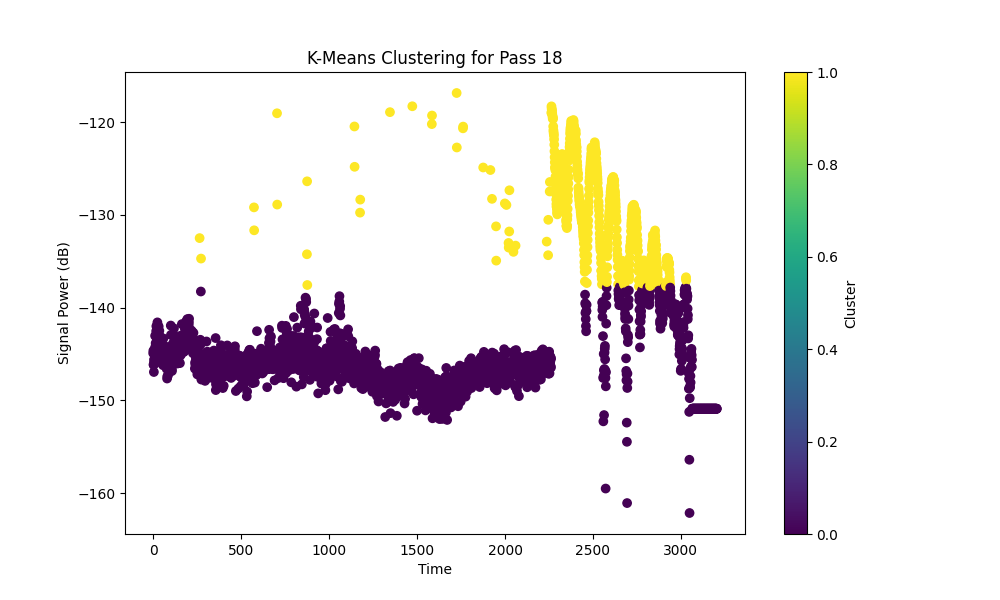

C:\Users\StoreElberg\AppData\Local\Temp\ipykernel_32336\4028116688.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


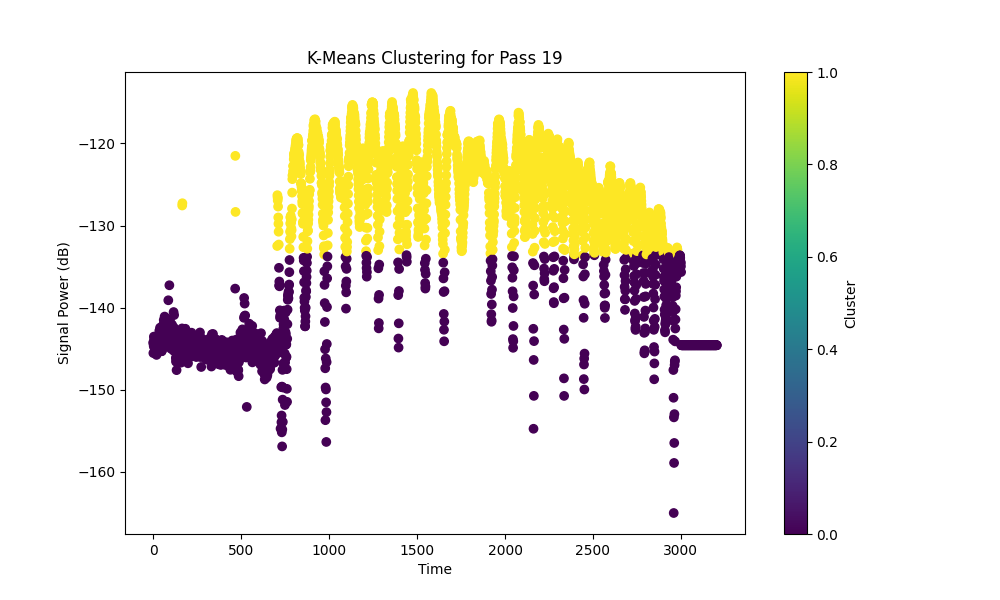

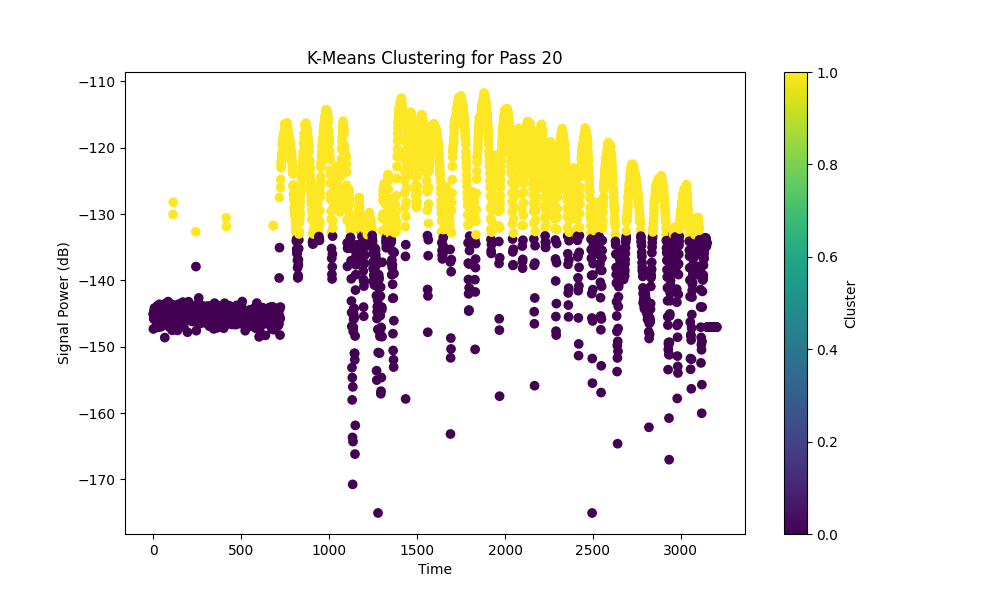

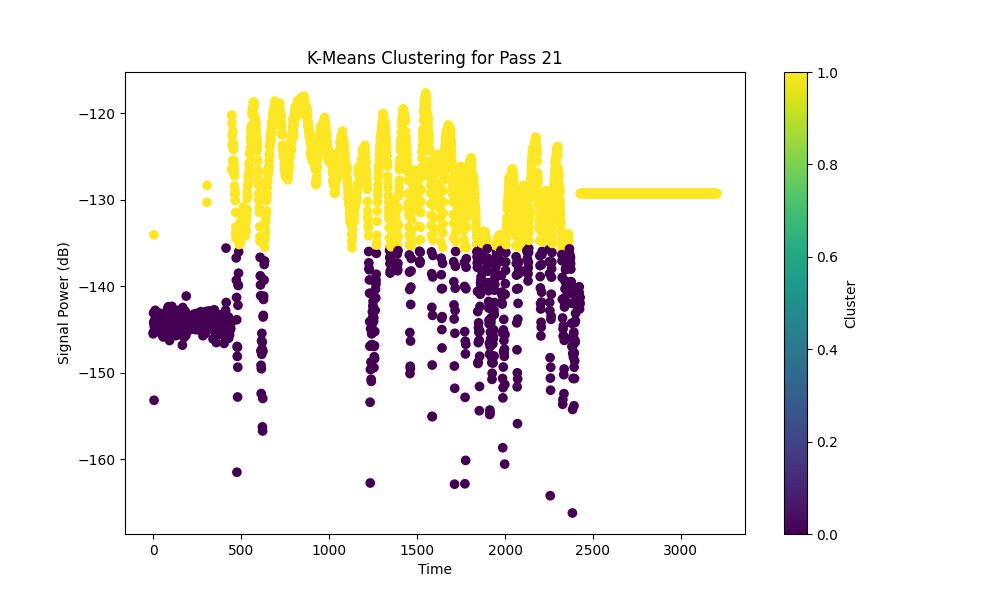

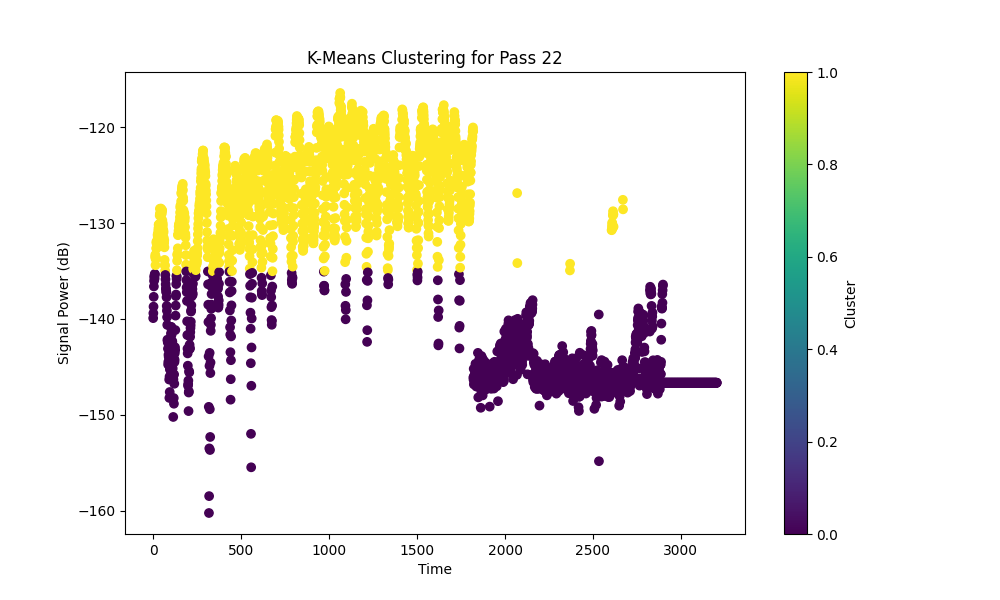

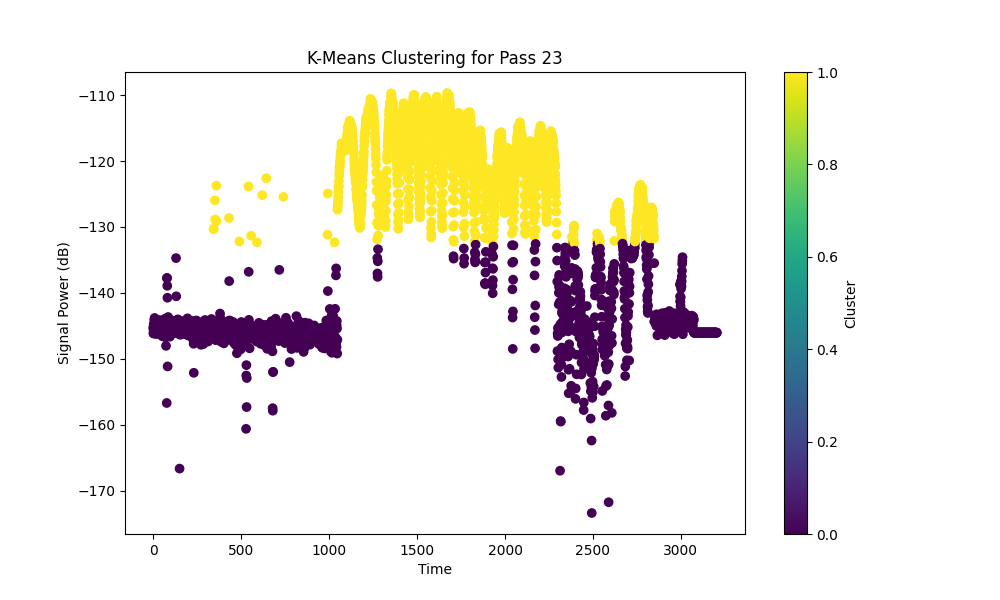

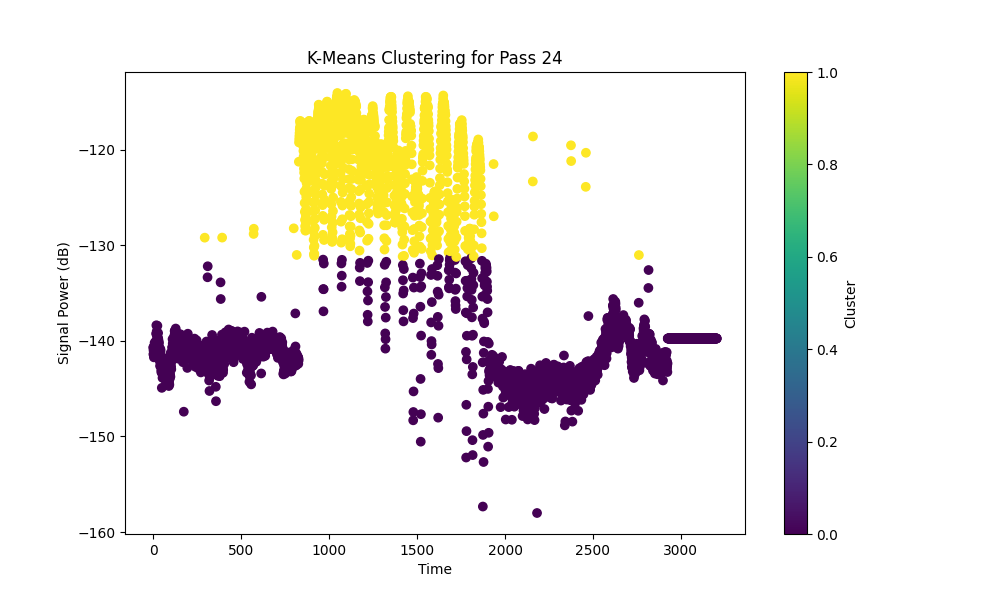

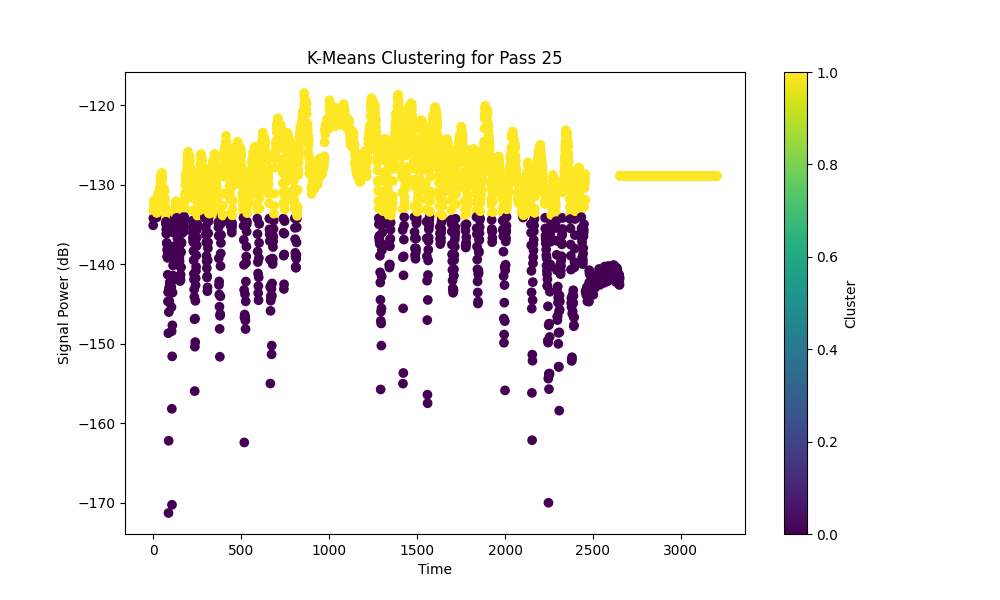

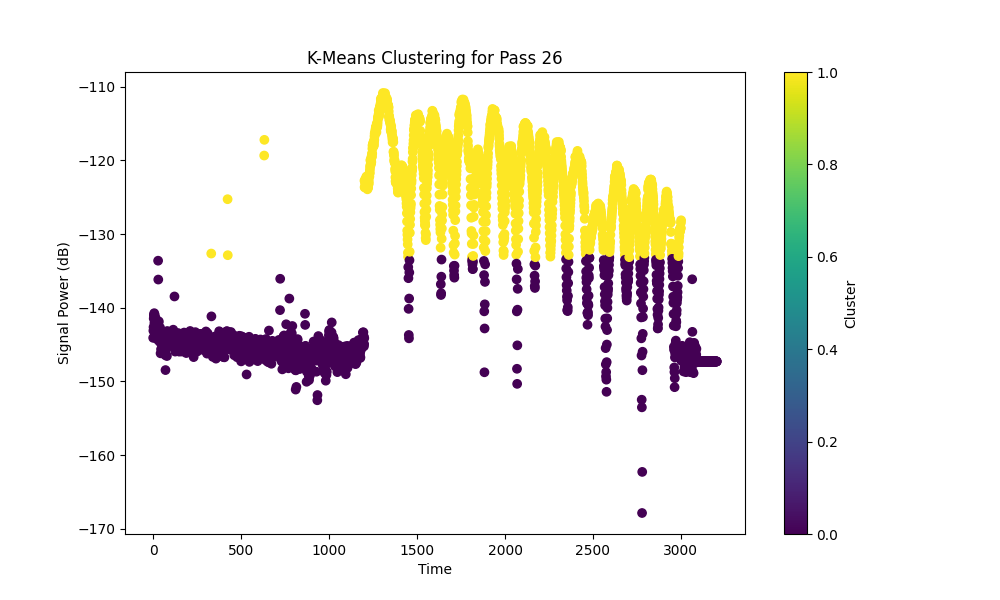

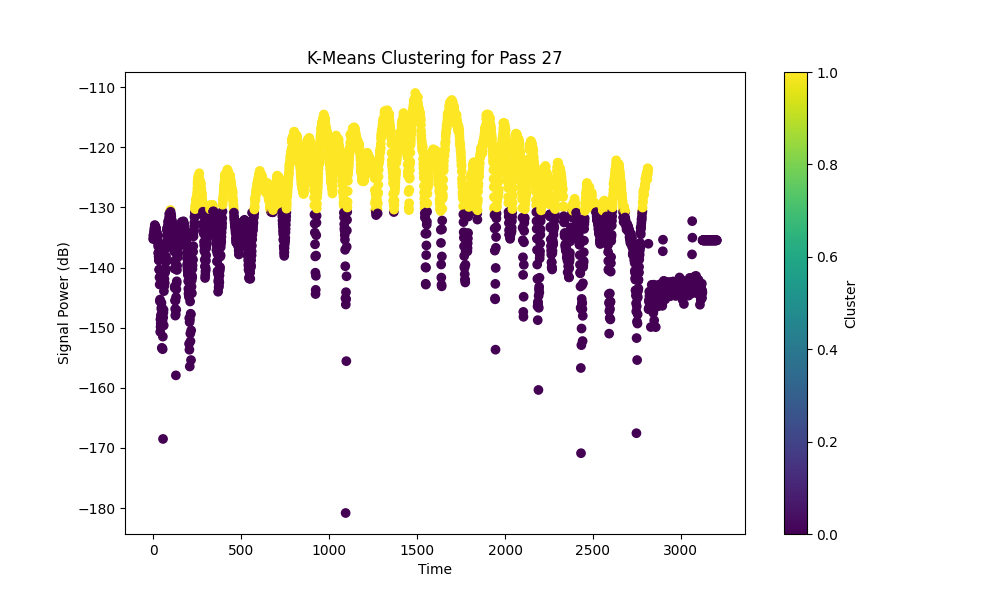

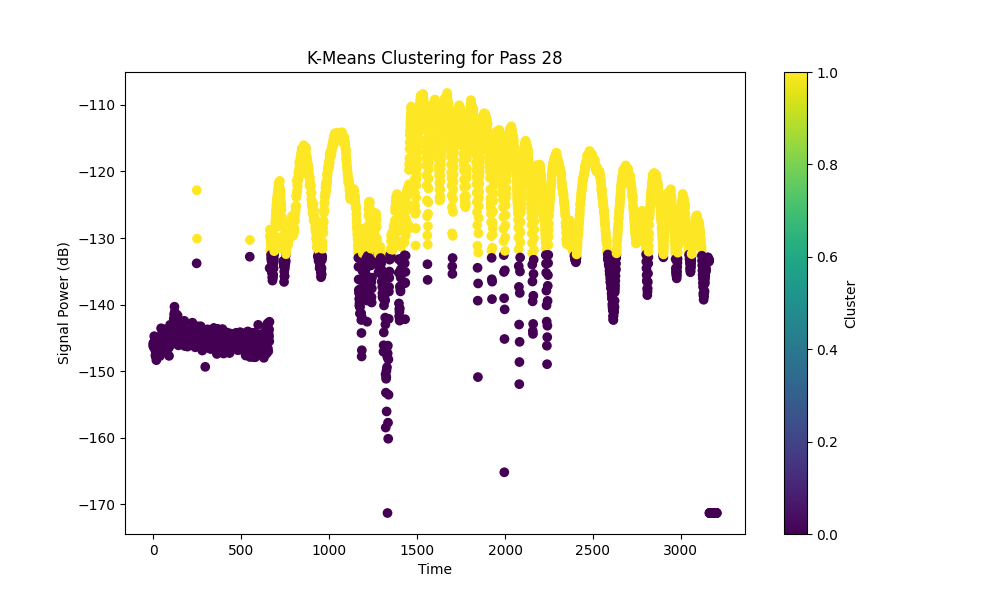

In [2]:
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Example: BAM shape (passes, features, time)
n_passes = BAM.shape[0]  # Number of passes
results = []  # To store labels per pass

for i in range(n_passes):
    # Extract signal power for the current pass
    signal_power = 10 * np.log10(BAM[i, 1, :])  # Assuming feature 1 is signal power
    
    # Handle missing values (e.g., NaN imputation)
    imputer = SimpleImputer(strategy='most_frequent')
    signal_power_imputed = imputer.fit_transform(signal_power.reshape(-1, 1)).flatten()
    
    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=2, random_state=42)
    clusters = kmeans.fit_predict(signal_power_imputed.reshape(-1, 1))
    centroids = kmeans.cluster_centers_

    # Assign classes based on cluster centroids
    non_transmitting_label = np.argmin(centroids)  # Cluster with the lowest centroid
    transmitting_label = np.argmax(centroids)      # Cluster with the highest centroid
    
    # Replace cluster labels with actual class labels
    labels = np.where(clusters == non_transmitting_label, 0, 1)
    
    # Store results for this pass
    results.append({
        "pass": i,
        "labels": labels,
        "centroids": centroids,
        "non_transmitting_label": non_transmitting_label,
        "transmitting_label": transmitting_label
    })
    
    # Optionally, visualize the clustering for each pass (e.g., time vs. signal power)
    plt.figure(figsize=(10, 6))
    plt.scatter(np.arange(len(signal_power_imputed)), signal_power_imputed, c=labels, cmap='viridis')
    plt.title(f'K-Means Clustering for Pass {i}')
    plt.xlabel('Time')
    plt.ylabel('Signal Power (dB)')
    plt.colorbar(label='Cluster')
    plt.show()



[  1   0   0   0   0   1   0   0   0   0   1   0   0   2   3   2   4   1
   8   7   5  10  18  15  29  34  32  48  61 788  89  79 130 177  69  89
 113 104 108 131 169 178 122 124 106  96  90 107  42  12] [-175.69531  -174.58455  -173.4738   -172.36304  -171.25229  -170.14153
 -169.03078  -167.92001  -166.80927  -165.6985   -164.58775  -163.47699
 -162.36624  -161.25548  -160.14473  -159.03397  -157.92322  -156.81245
 -155.7017   -154.59094  -153.4802   -152.36943  -151.25868  -150.14792
 -149.03717  -147.9264   -146.81564  -145.7049   -144.59413  -143.48338
 -142.37262  -141.26187  -140.15111  -139.04036  -137.9296   -136.81885
 -135.70808  -134.59734  -133.48657  -132.37582  -131.26506  -130.15431
 -129.04355  -127.93279  -126.82204  -125.71128  -124.600525 -123.48977
 -122.37901  -121.26826  -120.1575  ]
24 29
24
-148.48178


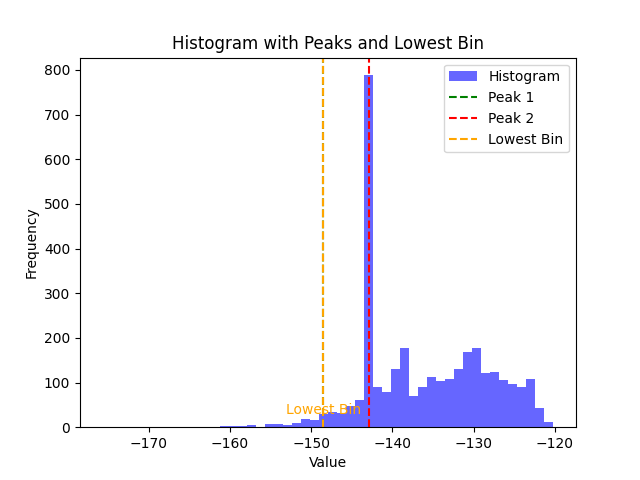

Lowest Bin Center: -148.48178100585938, Count: 29
[  1   0   2   0   0   0   0   1   4   3   5  26  81 277 495 613 409 125
  38  20  10  10   3   4   9   3   5   3  10  14  17  22  56  48  56  70
  65  75  51  81  76  49  50  59  58  52  65  59   9  16] [-162.86243  -161.78258  -160.70273  -159.62286  -158.54301  -157.46317
 -156.38332  -155.30345  -154.2236   -153.14375  -152.0639   -150.98405
 -149.90419  -148.82434  -147.74449  -146.66464  -145.58478  -144.50493
 -143.42508  -142.34523  -141.26538  -140.18552  -139.10567  -138.02582
 -136.94597  -135.86612  -134.78625  -133.7064   -132.62656  -131.5467
 -130.46684  -129.387    -128.30714  -127.22729  -126.14744  -125.06759
 -123.98773  -122.90788  -121.828026 -120.74818  -119.66832  -118.58847
 -117.50862  -116.428764 -115.348915 -114.26906  -113.18921  -112.10935
 -111.0295   -109.949646 -108.8698  ]
15 39
22
-138.56573


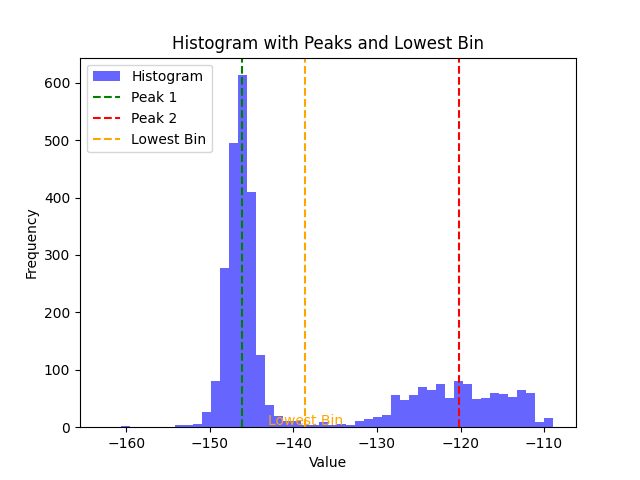

Lowest Bin Center: -138.56573486328125, Count: 3
[  1   0   0   0   0   0   0   0   0   0   1   1   1   0   2   1   2   5
   5   8  17  73 134 172 100  22   9   8  15  38  34  49  53  57  60  71
  66  83 100 158 658 157 158 170 192 136 103 104 121  60] [-168.29744  -167.27911  -166.26079  -165.24246  -164.22415  -163.20583
 -162.1875   -161.16917  -160.15085  -159.13252  -158.11421  -157.09589
 -156.07756  -155.05923  -154.04091  -153.02258  -152.00427  -150.98595
 -149.96762  -148.9493   -147.93097  -146.91264  -145.89433  -144.876
 -143.85768  -142.83936  -141.82103  -140.8027   -139.78438  -138.76607
 -137.74774  -136.72942  -135.71109  -134.69276  -133.67444  -132.65613
 -131.6378   -130.61948  -129.60115  -128.58282  -127.56451  -126.54618
 -125.527855 -124.50954  -123.49121  -122.472885 -121.45457  -120.43624
 -119.417915 -118.3996   -117.38127 ]
23 40
27
-140.29355


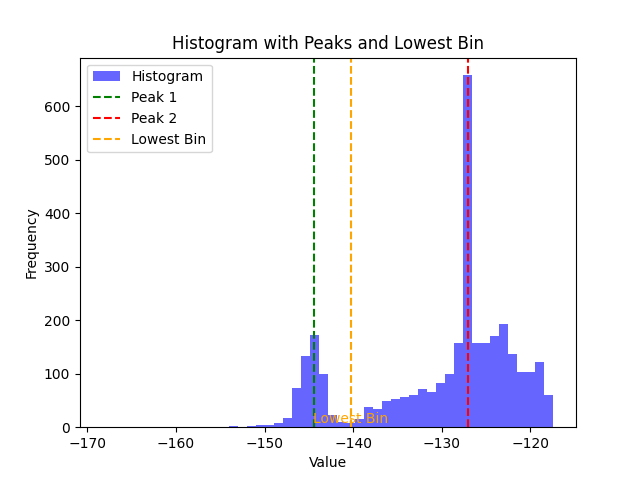

Lowest Bin Center: -140.29354858398438, Count: 8
[ 66   0   0   1   0   0   1   1   0   0   3   1   2   5   4   6  10  11
  23  28 107 544 295  22  26  32  32  46  34  33  34  48  83 105 149 125
 100  63  87  96 100  82 141  85 137 125 149 100  41  22] [-168.0828   -166.87115  -165.65953  -164.44789  -163.23625  -162.02463
 -160.81299  -159.60136  -158.38972  -157.17809  -155.96646  -154.75482
 -153.54318  -152.33156  -151.11992  -149.9083   -148.69666  -147.48502
 -146.27339  -145.06175  -143.85011  -142.63849  -141.42685  -140.21523
 -139.00359  -137.79195  -136.58032  -135.36868  -134.15704  -132.94542
 -131.73378  -130.52214  -129.31052  -128.09888  -126.887245 -125.67561
 -124.46398  -123.25234  -122.04071  -120.82908  -119.61745  -118.40581
 -117.194176 -115.982544 -114.77091  -113.55927  -112.34764  -111.13601
 -109.92438  -108.71274  -107.50111 ]
21 34
23
-139.6094


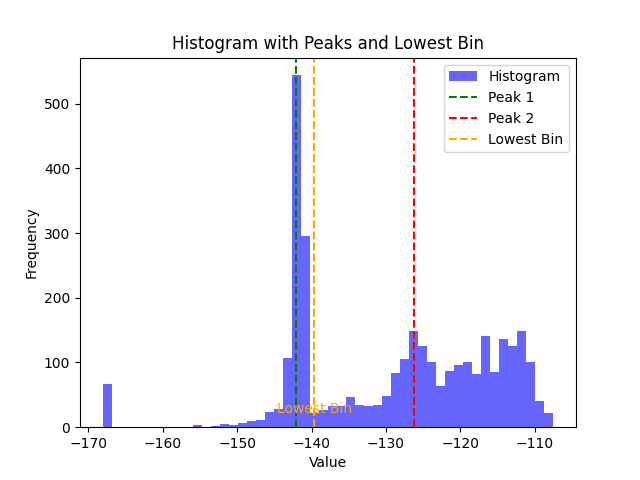

Lowest Bin Center: -139.60940551757812, Count: 22
[  1   0   0   0   0   0   0   0   0   1   0   0   1   3   3   3   9  11
  23  71 161 324 928 466 307 133  90  52  43  29  17  28  15  21  20  33
  33  36  24  25  33  36  58  28  21  35  34  14  13  22] [-166.50694  -165.5566   -164.60625  -163.6559   -162.70555  -161.7552
 -160.80486  -159.8545   -158.90416  -157.95381  -157.00346  -156.05312
 -155.10277  -154.15242  -153.20207  -152.25172  -151.30138  -150.35103
 -149.40068  -148.45033  -147.49998  -146.54964  -145.59929  -144.64894
 -143.6986   -142.74825  -141.7979   -140.84755  -139.8972   -138.94685
 -137.9965   -137.04616  -136.09581  -135.14546  -134.19511  -133.24477
 -132.29442  -131.34407  -130.39372  -129.44337  -128.49303  -127.54268
 -126.59233  -125.64198  -124.691635 -123.74129  -122.79094  -121.84059
 -120.89024  -119.939896 -118.98955 ]
22 25
24
-143.22342


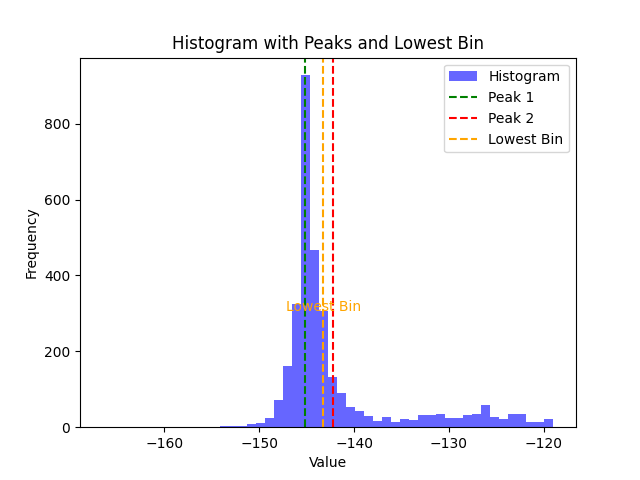

Lowest Bin Center: -143.22341918945312, Count: 307
[  1   0   0   0   0   2   2   1   0   5   2   1   5  13  63 201 991 457
 334 137  37  20  27  21  26  22  20  22  23  31  20  32  37  27  44  49
  55  52  33  35  35  45  44  33  34  34  57  58  12   5] [-159.57388  -158.71481  -157.85573  -156.99666  -156.13757  -155.2785
 -154.41943  -153.56035  -152.70128  -151.8422   -150.98312  -150.12405
 -149.26497  -148.4059   -147.54681  -146.68774  -145.82867  -144.96959
 -144.11052  -143.25143  -142.39236  -141.5333   -140.67421  -139.81514
 -138.95605  -138.09698  -137.23792  -136.37883  -135.51976  -134.66068
 -133.8016   -132.94254  -132.08345  -131.22438  -130.3653   -129.50623
 -128.64716  -127.78807  -126.929    -126.06992  -125.210846 -124.35177
 -123.49269  -122.63362  -121.77454  -120.91547  -120.05639  -119.19731
 -118.33824  -117.479164 -116.62009 ]
16 47
21
-141.10376


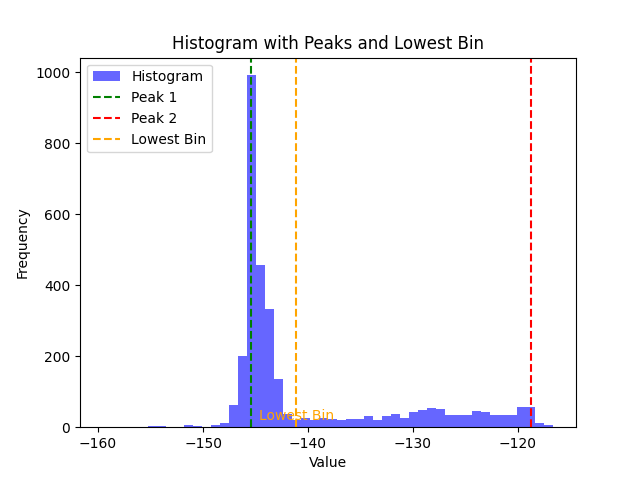

Lowest Bin Center: -141.103759765625, Count: 20
[  1   0   0   0   0   0   0   0   1   5   7  30 101 286 686 720 239  73
  17   7   4   5   7   4   9  18   9  17  29  29  35  38  43  49  51  75
  57  49  51 104  89  31  35  46  44  26  39   8  12  19] [-162.33888 -161.25975 -160.1806  -159.10147 -158.02232 -156.94319
 -155.86404 -154.78491 -153.70578 -152.62663 -151.5475  -150.46835
 -149.38922 -148.31007 -147.23094 -146.15181 -145.07266 -143.99353
 -142.91438 -141.83525 -140.7561  -139.67697 -138.59784 -137.51869
 -136.43956 -135.36041 -134.28128 -133.20213 -132.123   -131.04387
 -129.96472 -128.88559 -127.80644 -126.72731 -125.64817 -124.56903
 -123.48989 -122.41075 -121.33161 -120.25247 -119.17334 -118.0942
 -117.01506 -115.93592 -114.85678 -113.77764 -112.6985  -111.61937
 -110.54023 -109.46109 -108.38195]
15 39
20
-140.21654


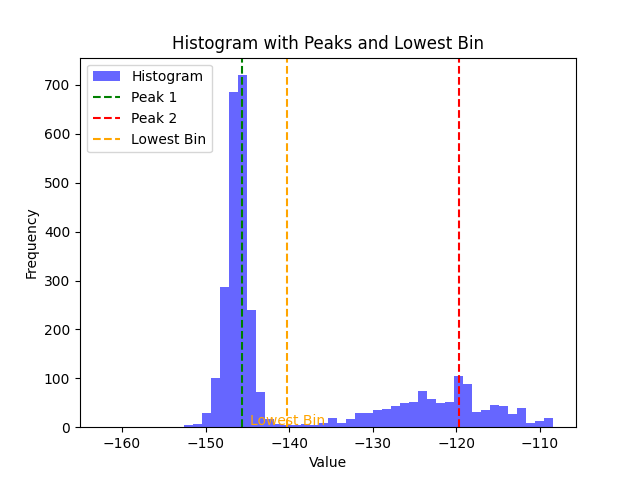

Lowest Bin Center: -140.21653747558594, Count: 4
[  1   0   0   0   0   2   1   6   2   3   4  10   4   8  12  14  53 113
 301 446 233  70  33  27 247  26  27  34  51  46  52  83  71  76  76  65
  53  67  57  59  62  57  74  80  81  94 103 110  58  53] [-159.06166  -158.13904  -157.21642  -156.29381  -155.37119  -154.44856
 -153.52594  -152.60333  -151.68071  -150.75809  -149.83546  -148.91286
 -147.99023  -147.06761  -146.14499  -145.22238  -144.29976  -143.37714
 -142.45451  -141.5319   -140.60928  -139.68666  -138.76404  -137.84143
 -136.91881  -135.99619  -135.07356  -134.15094  -133.22833  -132.30571
 -131.38309  -130.46046  -129.53786  -128.61523  -127.69261  -126.77
 -125.847374 -124.92476  -124.00214  -123.07952  -122.1569   -121.23428
 -120.31166  -119.389046 -118.46642  -117.54381  -116.621185 -115.69857
 -114.77595  -113.85333  -112.93071 ]
19 47
25
-135.53488


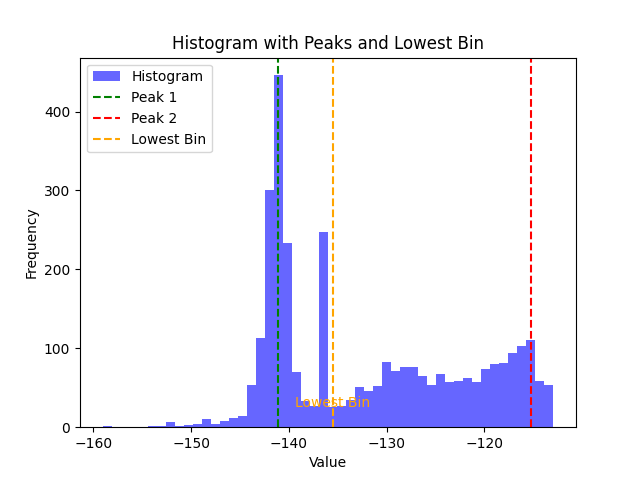

Lowest Bin Center: -135.53488159179688, Count: 26
[  1   0   1   0   2   1   2   7   3   2   8   4   8   4   5   6  11  19
  26  23  27  44  66  47  51  52  68  84 274 146 277 273 166  83  87  89
 107  97 110  88 108  92 113 136 129 119  56  52  29   2] [-163.2354   -162.25844  -161.28148  -160.30452  -159.32756  -158.3506
 -157.37364  -156.39668  -155.41972  -154.44276  -153.4658   -152.48885
 -151.51189  -150.53494  -149.55798  -148.58102  -147.60406  -146.6271
 -145.65015  -144.67319  -143.69623  -142.71927  -141.74231  -140.76535
 -139.78839  -138.81143  -137.83447  -136.85751  -135.88055  -134.9036
 -133.92664  -132.94968  -131.97272  -130.99576  -130.0188   -129.04184
 -128.06488  -127.08793  -126.11097  -125.13401  -124.15705  -123.18009
 -122.20313  -121.22617  -120.24922  -119.27226  -118.2953   -117.318344
 -116.341385 -115.364426 -114.38747 ]
22 30
23
-140.27687


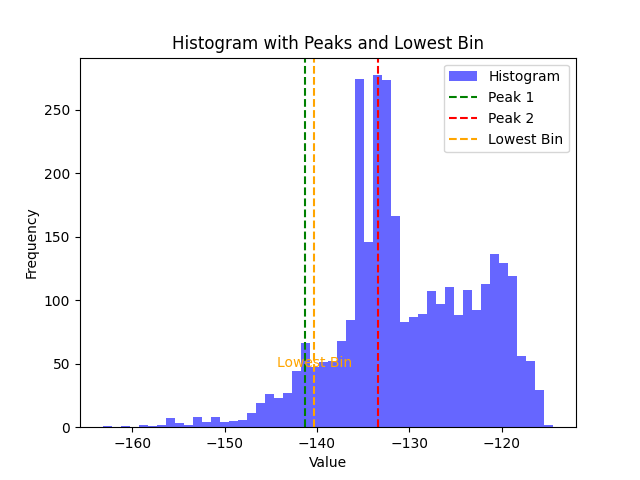

Lowest Bin Center: -140.27687072753906, Count: 47
[  1   0   0   1   0   0   3   1   7   6  42 197 326 586 539 246  68  49
  28  11   6   2   6   4   5  23  19  36  33  48  35  37  41  43  81  59
  49  93  66  45  49  52  55  40  47  32  43  44   0   1] [-160.1999  -159.21442 -158.22893 -157.24345 -156.25797 -155.27248
 -154.28699 -153.30151 -152.31602 -151.33054 -150.34505 -149.35956
 -148.37408 -147.3886  -146.4031  -145.41762 -144.43214 -143.44666
 -142.46117 -141.47568 -140.49019 -139.50471 -138.51923 -137.53374
 -136.54825 -135.56277 -134.57729 -133.5918  -132.60631 -131.62082
 -130.63535 -129.64986 -128.66437 -127.67889 -126.6934  -125.70791
 -124.72243 -123.73694 -122.75146 -121.76597 -120.78049 -119.795
 -118.80951 -117.82403 -116.83854 -115.85306 -114.86757 -113.88209
 -112.8966  -111.91112 -110.92563]
13 37
21
-139.01196


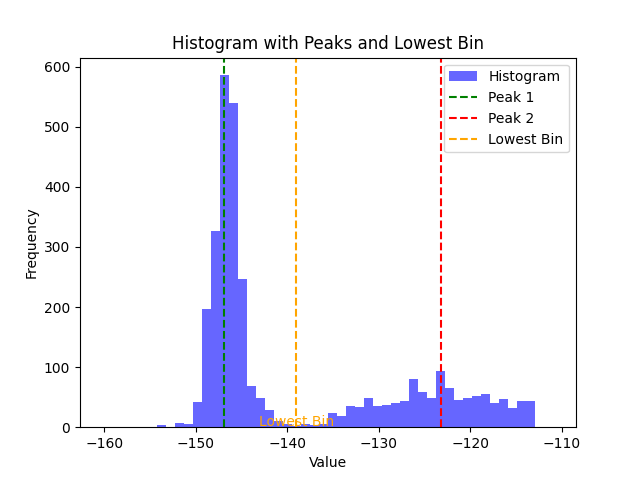

Lowest Bin Center: -139.011962890625, Count: 2
[102   1   1   1   2   0   1   2   4   4   8   7   9  11  22  23  39  60
 122 302 479 319 123  60  41  45  62  73  67  62  61  59  70  49  28  35
  41  57  53  73  70  59  62  53  76  64  60  80  58  45] [-168.71231  -167.5298   -166.34727  -165.16476  -163.98224  -162.79973
 -161.6172   -160.4347   -159.25217  -158.06966  -156.88715  -155.70462
 -154.52211  -153.33958  -152.15707  -150.97455  -149.79204  -148.60951
 -147.427    -146.24448  -145.06197  -143.87946  -142.69693  -141.51442
 -140.3319   -139.14938  -137.96686  -136.78435  -135.60182  -134.41931
 -133.23679  -132.05428  -130.87177  -129.68924  -128.50673  -127.3242
 -126.14169  -124.959175 -123.77666  -122.59414  -121.41162  -120.2291
 -119.046585 -117.86407  -116.68155  -115.49904  -114.31652  -113.134
 -111.951485 -110.76897  -109.58645 ]
20 47
34
-127.91547


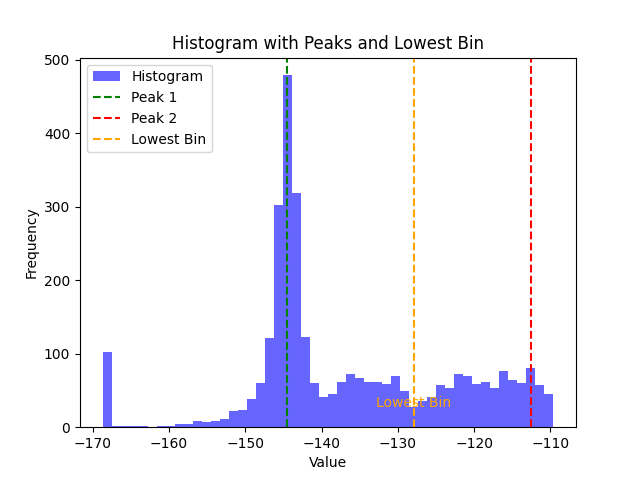

Lowest Bin Center: -127.91546630859375, Count: 28
[  1   2   0   0   0   0   1   3   0   1   3   9   5   2  11  19  18  19
  42  70  68 105 109 119 125 161 617 227 114  55  46  44  44  40  44  42
  75 102  78  59  84  74  60  57  73  94 149  68  47  19] [-177.44269  -176.25232  -175.06195  -173.87158  -172.68121  -171.49084
 -170.30048  -169.1101   -167.91974  -166.72937  -165.539    -164.34863
 -163.15826  -161.96788  -160.77751  -159.58714  -158.39677  -157.2064
 -156.01604  -154.82567  -153.6353   -152.44493  -151.25456  -150.0642
 -148.87383  -147.68346  -146.49309  -145.30272  -144.11235  -142.92198
 -141.73161  -140.54124  -139.35088  -138.1605   -136.97014  -135.77977
 -134.5894   -133.39903  -132.20865  -131.01828  -129.82791  -128.63754
 -127.44718  -126.25681  -125.06644  -123.87607  -122.6857   -121.49533
 -120.30496  -119.11459  -117.924225]
24 26
24
-148.27864


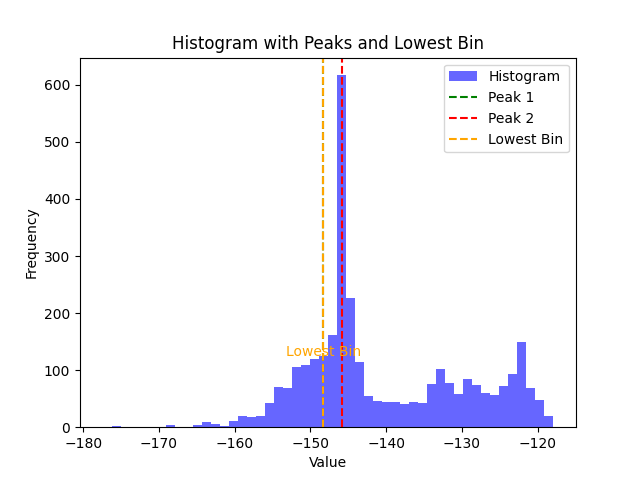

Lowest Bin Center: -148.2786407470703, Count: 125
[  1   0   0   1   0   3   4   9  57 261 470 491 394 228 113  34  15  10
   6  11  18  16  19  26  22  23  24  26  32  23  31  44  43  34  37  38
  42  41  40  70  52  47  36  58  53  51  35  37  56  23] [-156.78804  -155.84314  -154.89825  -153.95335  -153.00845  -152.06357
 -151.11867  -150.17377  -149.22887  -148.28398  -147.33908  -146.39418
 -145.4493   -144.5044   -143.5595   -142.6146   -141.66971  -140.72481
 -139.7799   -138.83502  -137.89012  -136.94522  -136.00034  -135.05544
 -134.11053  -133.16565  -132.22075  -131.27585  -130.33095  -129.38606
 -128.44116  -127.49627  -126.55137  -125.606476 -124.661575 -123.71668
 -122.77179  -121.82689  -120.881996 -119.937096 -118.9922   -118.04731
 -117.10241  -116.15752  -115.212616 -114.26772  -113.32283  -112.37793
 -111.43304  -110.48814  -109.54324 ]
11 39
18
-139.30746


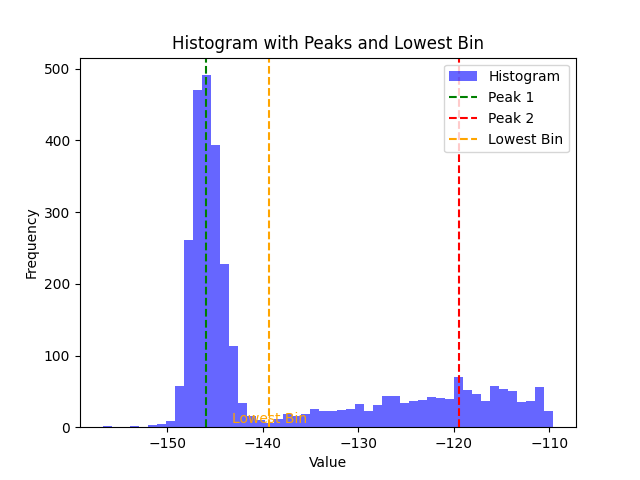

Lowest Bin Center: -139.30746459960938, Count: 6
[  1   0   0   0   0   1   0   1   2   1   1   2   4   2   1   8  12  10
  11  18  16  37 357 254 401 423 359 141  23  20  13  23  52  42  60  56
  64  46  63  78  72  56  44  58  67  73  88  65  43  36] [-170.39024  -169.25931  -168.12836  -166.99742  -165.86647  -164.73553
 -163.6046   -162.47365  -161.34271  -160.21176  -159.08083  -157.94987
 -156.81894  -155.688    -154.55705  -153.42612  -152.29517  -151.16423
 -150.0333   -148.90234  -147.77141  -146.64046  -145.50952  -144.37859
 -143.24763  -142.1167   -140.98575  -139.85481  -138.72388  -137.59293
 -136.46199  -135.33104  -134.2001   -133.06915  -131.93822  -130.80728
 -129.67633  -128.5454   -127.41445  -126.28351  -125.152565 -124.02162
 -122.890686 -121.75974  -120.6288   -119.497856 -118.36691  -117.23597
 -116.105034 -114.97409  -113.84315 ]
24 25
24
-142.68216


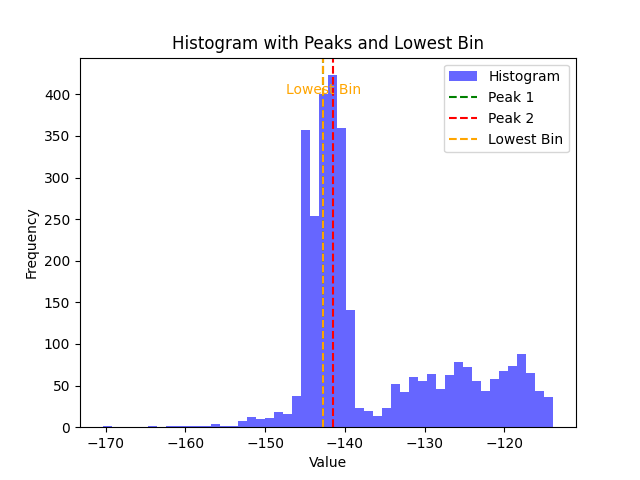

Lowest Bin Center: -142.68215942382812, Count: 401
[  1   0   0   1   0   0   0   2   2   4   1   0   2   0   6   5  23  72
 122 152 119 412  59  28  13  15  30  23  46  69  66  71  92 103  93  83
  77  82  85 114 102 126 147 153 112 101 115  97 106  73] [-164.4898   -163.50996  -162.53012  -161.5503   -160.57045  -159.5906
 -158.61076  -157.63092  -156.6511   -155.67125  -154.6914   -153.71156
 -152.73172  -151.75189  -150.77205  -149.7922   -148.81236  -147.83252
 -146.85269  -145.87285  -144.893    -143.91316  -142.93332  -141.95349
 -140.97365  -139.9938   -139.01396  -138.03412  -137.05429  -136.07445
 -135.0946   -134.11476  -133.13492  -132.15509  -131.17525  -130.1954
 -129.21556  -128.23572  -127.25588  -126.27605  -125.2962   -124.31636
 -123.336525 -122.35668  -121.37685  -120.397    -119.41716  -118.437325
 -117.45748  -116.477646 -115.4978  ]
21 43
24
-140.48373


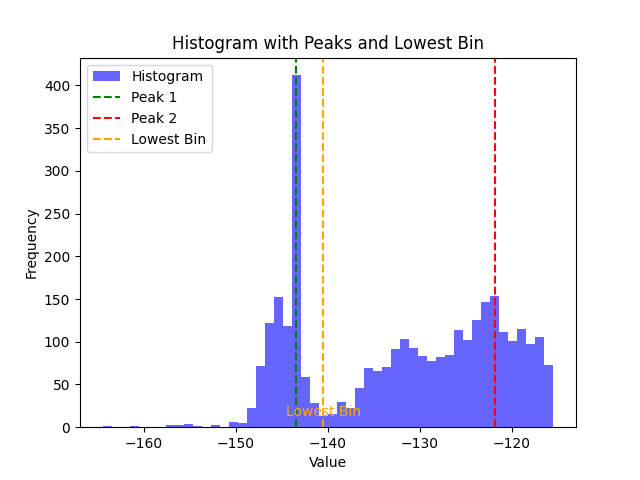

Lowest Bin Center: -140.48373413085938, Count: 13
[  2   0   1   0   3   1   0   2   1   7   3   6  11  13  17  65 212 286
 157  55  54  37  30  20  24  40  39  35  64  55  77  66  83 155  73  87
  90 111 112 118 113 101 104 135 163 131  88  94  45  19] [-163.67636  -162.64937  -161.62239  -160.5954   -159.5684   -158.54141
 -157.51443  -156.48744  -155.46045  -154.43346  -153.40648  -152.37949
 -151.3525   -150.3255   -149.29852  -148.27153  -147.24454  -146.21754
 -145.19057  -144.16357  -143.13658  -142.10959  -141.08261  -140.05562
 -139.02863  -138.00165  -136.97466  -135.94766  -134.92067  -133.89369
 -132.8667   -131.8397   -130.81271  -129.78574  -128.75874  -127.73175
 -126.704765 -125.67777  -124.65079  -123.623795 -122.59681  -121.56982
 -120.54283  -119.51584  -118.48885  -117.46186  -116.434875 -115.40788
 -114.3809   -113.353905 -112.32692 ]
17 44
23
-139.54211


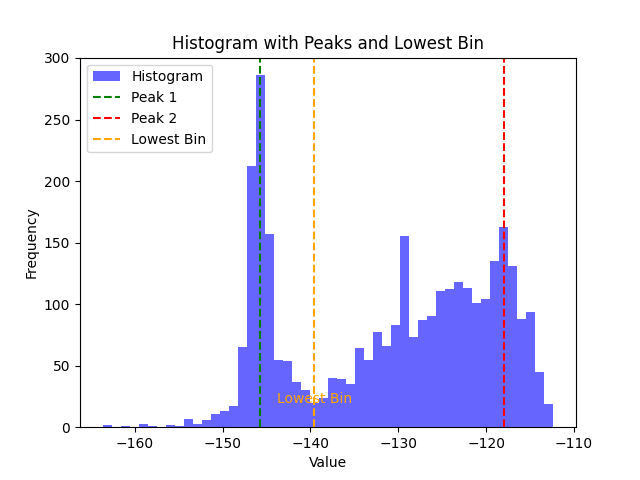

Lowest Bin Center: -139.5421142578125, Count: 20
[  2   2   0   1   0   2   0   1   1   2   1   4   4   9   9  16  35  86
 144 174  95  38  35  33  48  71  66  71 359  50  67  83 102  85  88 104
  90 103 122 118  96  88 104 113 140 128  97  91  22   5] [-163.21146  -162.2713   -161.33116  -160.391    -159.45087  -158.51071
 -157.57057  -156.63042  -155.69028  -154.75012  -153.80997  -152.86983
 -151.92967  -150.98953  -150.04938  -149.10924  -148.16908  -147.22893
 -146.28879  -145.34863  -144.4085   -143.46834  -142.5282   -141.58804
 -140.6479   -139.70775  -138.7676   -137.82745  -136.8873   -135.94716
 -135.007    -134.06686  -133.12671  -132.18657  -131.24641  -130.30626
 -129.36612  -128.42596  -127.48582  -126.54567  -125.60552  -124.665375
 -123.72523  -122.78508  -121.84493  -120.904785 -119.96463  -119.02448
 -118.084335 -117.14419  -116.20404 ]
19 28
23
-141.11798


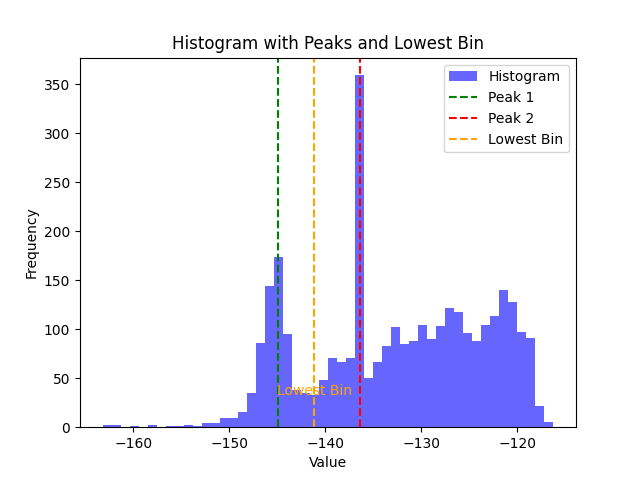

Lowest Bin Center: -141.11798095703125, Count: 33
[  1   0   0   1   0   1   3   0   2   3  14  31  45  98 206 565 672 311
  86  35  18  10   5   7  14   6  21  13  23  12  18  20  42  45  37  27
  37  42  26  30  49  37  68 100 108  66 124  64  38  24] [-161.85625  -160.82759  -159.79893  -158.77026  -157.74161  -156.71295
 -155.6843   -154.65562  -153.62697  -152.59831  -151.56966  -150.54099
 -149.51233  -148.48367  -147.45502  -146.42636  -145.39769  -144.36903
 -143.34038  -142.31172  -141.28305  -140.2544   -139.22574  -138.19708
 -137.16841  -136.13976  -135.1111   -134.08244  -133.05379  -132.02512
 -130.99646  -129.9678   -128.93915  -127.910484 -126.88182  -125.853165
 -124.8245   -123.795845 -122.76719  -121.738525 -120.70987  -119.681206
 -118.65255  -117.623886 -116.59523  -115.56657  -114.53791  -113.50925
 -112.48059  -111.45193  -110.42327 ]
16 46
22
-138.71141


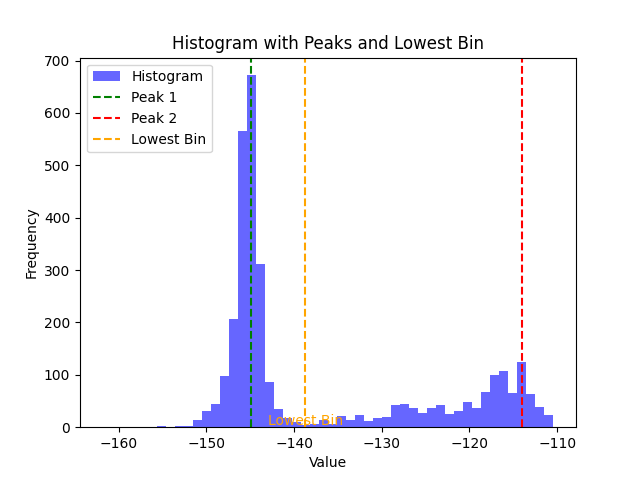

Lowest Bin Center: -138.71141052246094, Count: 5
[  1   1   1   0   0   0   1   0   1   0   2  14 165  59 139 269 387 564
 450 175 107  67  55  43  50  48  38  35  34  48  26  27  27  21  33  29
  40  27  25  33  19  28  27  26   9  17  23   9   4   1] [-162.15178  -161.24597  -160.34015  -159.43434  -158.52852  -157.62271
 -156.71689  -155.81108  -154.90526  -153.99945  -153.09363  -152.18782
 -151.282    -150.37619  -149.47037  -148.56456  -147.65874  -146.75293
 -145.8471   -144.9413   -144.03548  -143.12967  -142.22385  -141.31804
 -140.41222  -139.50641  -138.6006   -137.69478  -136.78897  -135.88315
 -134.97734  -134.07152  -133.16571  -132.25989  -131.35408  -130.44826
 -129.54245  -128.63663  -127.73082  -126.825005 -125.91919  -125.013374
 -124.10756  -123.201744 -122.29593  -121.390114 -120.4843   -119.57848
 -118.67267  -117.76685  -116.86104 ]
17 25
23
-140.86513


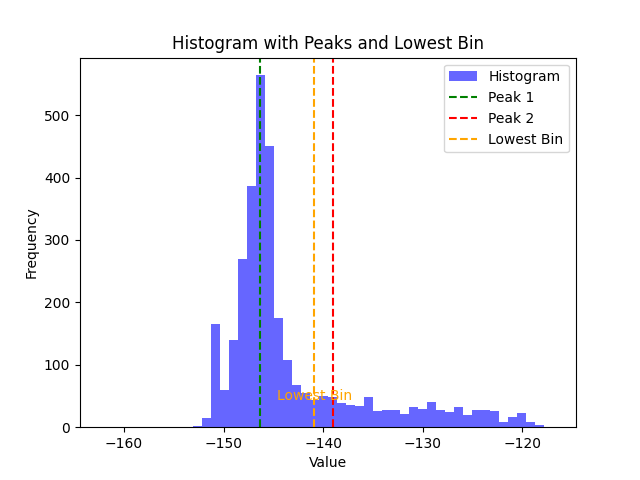

Lowest Bin Center: -140.86512756347656, Count: 43
[  1   0   0   0   0   1   0   1   2   2   4   4   3   6   6   4  16  45
 132 463 181  82  55  26  26  29  32  31  37  54  59  72  62  82  83 100
 114 118 120 129 177 142 121 141 128  84  83  74  48  25] [-165.01706  -163.99377  -162.97049  -161.9472   -160.92392  -159.90063
 -158.87735  -157.85406  -156.83078  -155.8075   -154.78421  -153.76091
 -152.73763  -151.71434  -150.69106  -149.66777  -148.64449  -147.6212
 -146.59792  -145.57463  -144.55135  -143.52806  -142.50478  -141.48149
 -140.4582   -139.43492  -138.41164  -137.38835  -136.36507  -135.34178
 -134.31848  -133.2952   -132.27191  -131.24863  -130.22534  -129.20206
 -128.17877  -127.15549  -126.1322   -125.10892  -124.08563  -123.06235
 -122.03906  -121.01578  -119.99249  -118.96921  -117.945915 -116.92263
 -115.899345 -114.87606  -113.852776]
19 40
23
-140.96985


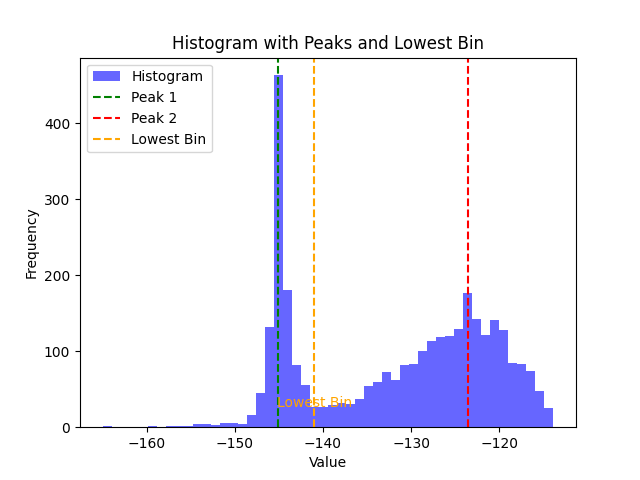

Lowest Bin Center: -140.9698486328125, Count: 26
[  2   0   0   1   0   0   1   1   3   1   2   2   0   4   4   5   5   7
  12  10  15  31 192 420 212  34  26  31  46  56  69  71  96 101 114  96
 113 133 134 110 125 107 107 132 122 161 114  90  49  38] [-175.04846  -173.78265  -172.51685  -171.25105  -169.98524  -168.71944
 -167.45363  -166.18782  -164.92201  -163.65622  -162.39041  -161.1246
 -159.8588   -158.59299  -157.32718  -156.06139  -154.79558  -153.52977
 -152.26396  -150.99815  -149.73235  -148.46655  -147.20074  -145.93494
 -144.66913  -143.40332  -142.13751  -140.87172  -139.60591  -138.3401
 -137.0743   -135.80849  -134.54268  -133.27689  -132.01108  -130.74527
 -129.47946  -128.21365  -126.94785  -125.682045 -124.416245 -123.15044
 -121.88463  -120.61883  -119.35302  -118.08721  -116.82141  -115.5556
 -114.289795 -113.023994 -111.75819 ]
23 45
26
-141.50461


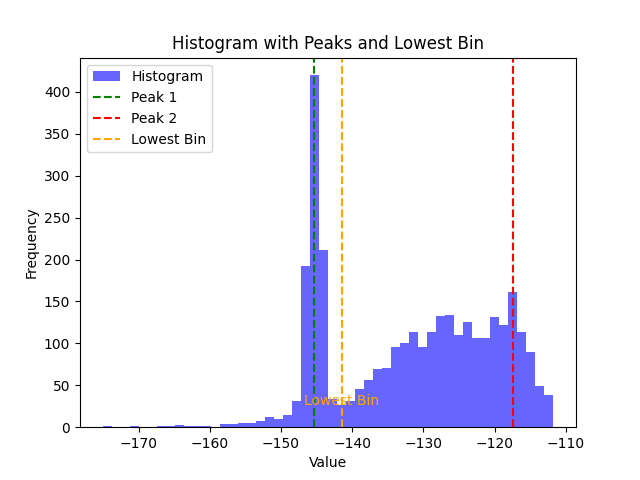

Lowest Bin Center: -141.50460815429688, Count: 26
[  1   0   1   3   1   1   1   1   0   1   2   4   5   7   5   7   8  19
  15  19  30  84 235 160  36  31  32  23  32  39  33  49  81  72  64  79
  78  75 861 112 131 126 126  84  91  84  76  82  66  32] [-166.21152  -165.24081  -164.27011  -163.29941  -162.32869  -161.35799
 -160.38728  -159.41658  -158.44588  -157.47517  -156.50447  -155.53375
 -154.56305  -153.59235  -152.62164  -151.65094  -150.68024  -149.70953
 -148.73882  -147.76811  -146.79741  -145.8267   -144.856    -143.8853
 -142.9146   -141.94388  -140.97318  -140.00247  -139.03177  -138.06107
 -137.09036  -136.11966  -135.14896  -134.17824  -133.20753  -132.23683
 -131.26613  -130.29543  -129.32472  -128.35402  -127.38331  -126.412605
 -125.441895 -124.47119  -123.50049  -122.52978  -121.559074 -120.58837
 -119.61767  -118.64696  -117.676254]
22 38
27
-139.51712


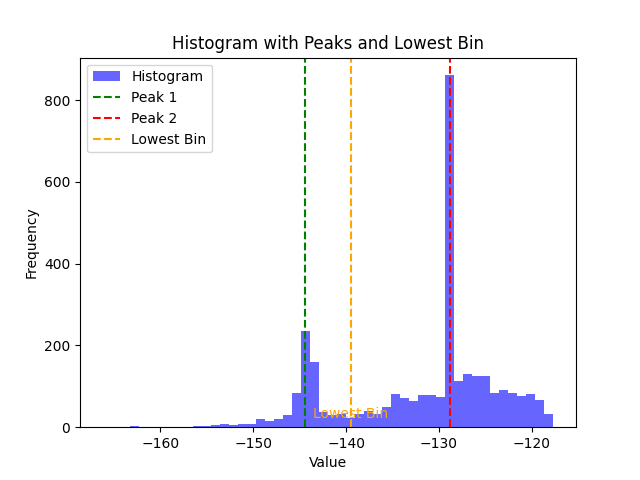

Lowest Bin Center: -139.51712036132812, Count: 23
[  1   0   1   0   0   1   1   2   0   2   0   1  11  19  95 525 273 181
  86  73  49  51  45  33  39  19  39  37  42  30  50  52  63  58  89  94
  92  77  88  82 102 108 115 110  78 117  89  65  14   6] [-160.24353  -159.36737  -158.49121  -157.61504  -156.73888  -155.86272
 -154.98656  -154.11038  -153.23422  -152.35806  -151.4819   -150.60573
 -149.72957  -148.85341  -147.97725  -147.10107  -146.22491  -145.34875
 -144.4726   -143.59642  -142.72026  -141.8441   -140.96794  -140.09177
 -139.2156   -138.33945  -137.46329  -136.58713  -135.71095  -134.8348
 -133.95863  -133.08247  -132.2063   -131.33014  -130.45398  -129.57782
 -128.70164  -127.825485 -126.949326 -126.07316  -125.197    -124.32083
 -123.44467  -122.568504 -121.692345 -120.81618  -119.94002  -119.06385
 -118.18769  -117.31152  -116.43536 ]
15 45
25
-137.90137


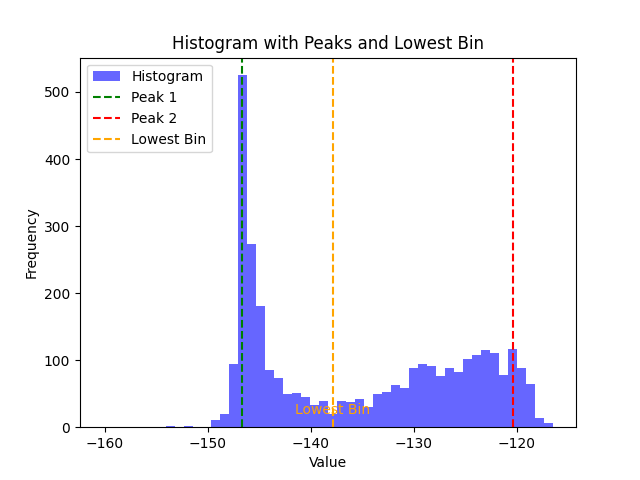

Lowest Bin Center: -137.9013671875, Count: 19
[  1   1   0   0   0   2   0   0   1   0   3   3   5   4   6   7  10  20
  19  49 187 646 481 119  24  29  32  32  33  29  48  36  47  46  59  80
  85  57  84  70  61  71  78 117 106 109  80  89  85  54] [-173.38196  -172.10805  -170.83414  -169.56023  -168.28632  -167.0124
 -165.7385   -164.46458  -163.19067  -161.91676  -160.64285  -159.36894
 -158.09503  -156.82112  -155.54721  -154.2733   -152.99939  -151.72548
 -150.45157  -149.17766  -147.90375  -146.62984  -145.35593  -144.08202
 -142.8081   -141.5342   -140.26028  -138.98637  -137.71246  -136.43855
 -135.16464  -133.89073  -132.61682  -131.34291  -130.069    -128.79509
 -127.52117  -126.24726  -124.97335  -123.69944  -122.42553  -121.15162
 -119.87771  -118.6038   -117.32989  -116.05598  -114.78207  -113.508156
 -112.234245 -110.960335 -109.686424]
21 43
24
-142.17114


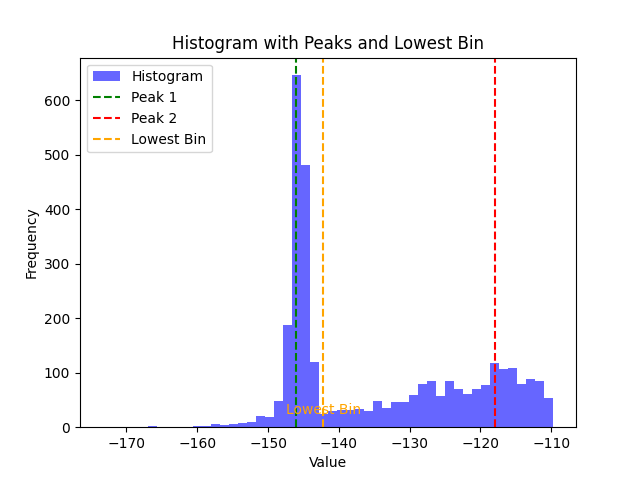

Lowest Bin Center: -142.171142578125, Count: 24
[  2   0   0   0   0   0   3   1   2   3   3  10  22  52 103 163 256 248
 275 275 525 122  52  30  17  16  20  15  15  25  20  23  34  32  33  40
  40  50  38  47  35  45  56  65  53  54  99  58  85  43] [-158.01004  -157.13156  -156.25308  -155.3746   -154.49612  -153.61765
 -152.73917  -151.8607   -150.98222  -150.10374  -149.22527  -148.34679
 -147.4683   -146.58983  -145.71135  -144.83287  -143.95439  -143.07591
 -142.19743  -141.31897  -140.44049  -139.56201  -138.68353  -137.80505
 -136.92657  -136.0481   -135.16962  -134.29114  -133.41266  -132.53418
 -131.6557   -130.77722  -129.89876  -129.02028  -128.1418   -127.26332
 -126.38484  -125.50636  -124.627884 -123.749405 -122.870926 -121.992455
 -121.113976 -120.2355   -119.35702  -118.47854  -117.60006  -116.72159
 -115.84311  -114.96463  -114.08615 ]
20 46
27
-133.8519


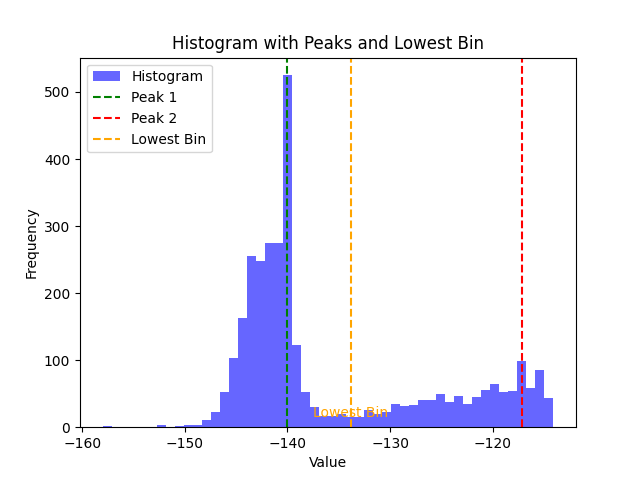

Lowest Bin Center: -133.85189819335938, Count: 15
[  2   1   0   0   0   0   0   0   3   0   0   0   2   1   6   3   4   2
   8   3   6   7  11  17  13  35  53  81 121  60  45  44  60  69  77  95
 104 126 141 169 750 187 193 153 130 102 129 115  63  14] [-171.30057  -170.24402  -169.18748  -168.13094  -167.0744   -166.01785
 -164.96132  -163.90477  -162.84824  -161.79169  -160.73515  -159.6786
 -158.62207  -157.56552  -156.50897  -155.45244  -154.39589  -153.33936
 -152.2828   -151.22627  -150.16972  -149.11319  -148.05664  -147.0001
 -145.94356  -144.88702  -143.83047  -142.77393  -141.71739  -140.66084
 -139.60431  -138.54776  -137.49123  -136.43468  -135.37814  -134.3216
 -133.26506  -132.20851  -131.15196  -130.09543  -129.03888  -127.982346
 -126.925804 -125.86926  -124.81271  -123.75617  -122.69963  -121.64309
 -120.58655  -119.53001  -118.473465]
23 40
24
-145.41528


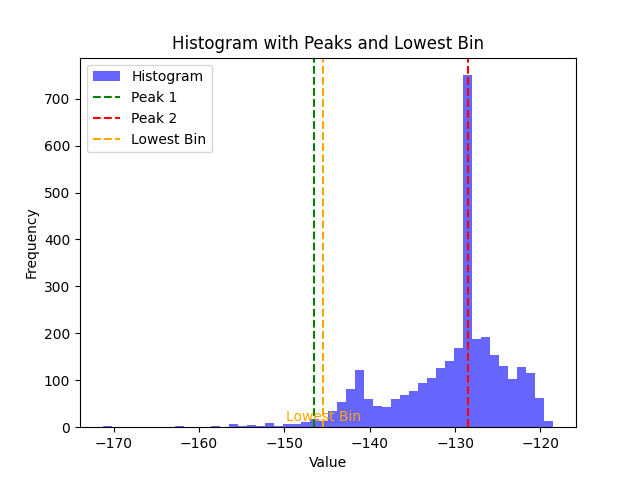

Lowest Bin Center: -145.415283203125, Count: 13
[  1   0   0   0   1   0   0   0   0   0   0   0   1   2   4   6  28  75
 352 412 412 107  28  22  20  27  19  27  27  37  42  44  56  63  66  81
  92  74  95 133 107 100 112 111 104  56 102  78  46  35] [-167.85805  -166.71806  -165.57808  -164.4381   -163.29811  -162.15813
 -161.01814  -159.87816  -158.73817  -157.59819  -156.4582   -155.31822
 -154.17824  -153.03824  -151.89825  -150.75827  -149.61829  -148.4783
 -147.33832  -146.19833  -145.05835  -143.91837  -142.77838  -141.6384
 -140.49841  -139.35843  -138.21844  -137.07846  -135.93848  -134.7985
 -133.65851  -132.51852  -131.37854  -130.23856  -129.09857  -127.95858
 -126.818596 -125.67861  -124.53863  -123.39864  -122.25866  -121.118675
 -119.97869  -118.83871  -117.698715 -116.55873  -115.41875  -114.27876
 -113.13878  -111.998795 -110.85881 ]
19 39
26
-137.64845


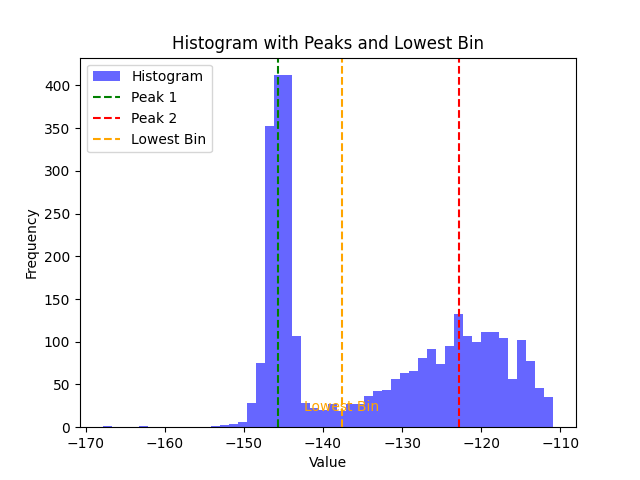

Lowest Bin Center: -137.64845275878906, Count: 19
[  1   0   0   0   0   0   0   1   1   1   0   0   0   0   1   0   1   2
   3   6   5   5  12  19  34  65 171 126  47  52  69  88 196 161 150 131
 190 134 180 198 220 154 136 141 152 110  98  85  40  19] [-180.81184  -179.4149   -178.01796  -176.621    -175.22406  -173.82712
 -172.43018  -171.03322  -169.63628  -168.23933  -166.84239  -165.44543
 -164.0485   -162.65155  -161.25461  -159.85765  -158.46071  -157.06377
 -155.66682  -154.26987  -152.87292  -151.47598  -150.07904  -148.68208
 -147.28514  -145.8882   -144.49126  -143.09431  -141.69736  -140.30042
 -138.90347  -137.50653  -136.10957  -134.71263  -133.31569  -131.91875
 -130.52179  -129.12485  -127.727905 -126.330956 -124.93401  -123.53706
 -122.14012  -120.74317  -119.34623  -117.94928  -116.55234  -115.15539
 -113.758446 -112.361496 -110.964554]
24 40
24
-146.58667


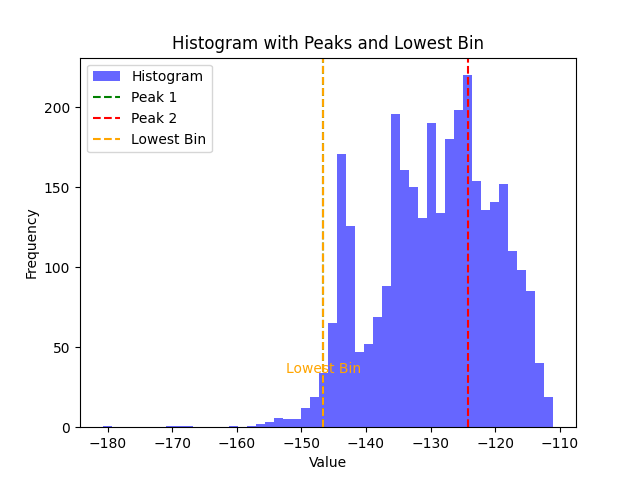

Lowest Bin Center: -146.586669921875, Count: 34
[ 44   0   0   0   1   0   0   0   1   0   2   0   1   0   2   2   4   4
  23 111 328 160  50  22  18  29  38  37  58  75 110  99 121 130 145 134
 122 143 133 110 161 135 131  96 110  81  56  71  67  40] [-171.29306  -170.0314   -168.76974  -167.50809  -166.24641  -164.98476
 -163.7231   -162.46144  -161.19978  -159.93813  -158.67647  -157.4148
 -156.15314  -154.89148  -153.62982  -152.36816  -151.1065   -149.84485
 -148.58318  -147.32152  -146.05986  -144.7982   -143.53654  -142.27489
 -141.01323  -139.75156  -138.4899   -137.22824  -135.96658  -134.70493
 -133.44327  -132.18161  -130.91995  -129.65828  -128.39662  -127.134964
 -125.87331  -124.61165  -123.34998  -122.088326 -120.82667  -119.56501
 -118.303345 -117.04169  -115.78003  -114.518364 -113.25671  -111.99505
 -110.73339  -109.471725 -108.21007 ]
20 40
24
-140.38239


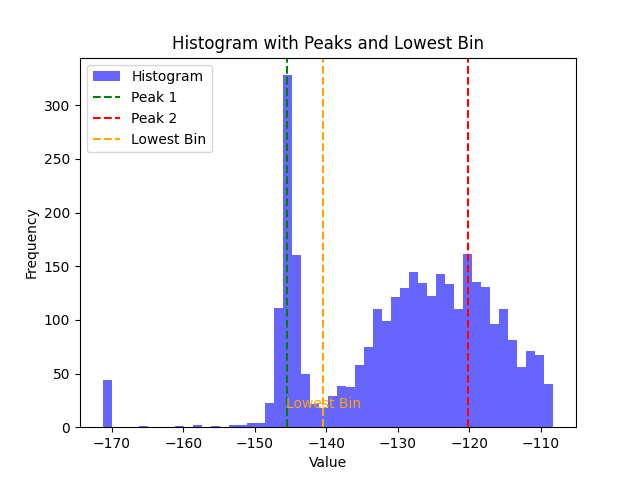

Lowest Bin Center: -140.38238525390625, Count: 18


In [13]:
import numpy as np
from sklearn.impute import SimpleImputer
n_passes = BAM.shape[0]  # Number of passes
results = []  # To store labels per pass

for i in range(n_passes):
    # Extract signal power for the current pass
    signal_power = 10*np.log10(BAM[i, 1, :])  # Assuming feature 1 is signal power

    # Handle missing values (e.g., NaN imputation)
    imputer = SimpleImputer(strategy='most_frequent')
    signal_power_imputed = imputer.fit_transform(signal_power.reshape(-1, 1)).flatten()
    # Create the histogram
    bins = 50
    counts, bin_edges = np.histogram(signal_power_imputed, bins=bins)
    print(counts, bin_edges)
    # Convert bin_edges to bin centers for easier visualization
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Identify the peaks
    peak1_idx = np.argmax(counts[:len(counts) // 2])  # First half
    peak2_idx = np.argmax(counts[len(counts) // 2:]) + len(counts) // 2  # Second half
    print(peak1_idx, peak2_idx)
    # Focus on the range between the two peaks
    min_bin_idx = np.argmin(counts[peak1_idx:peak2_idx]) + peak1_idx
    print(min_bin_idx)
    # Get the bin center and count of the lowest bin
    lowest_bin_center = bin_centers[min_bin_idx]
    lowest_bin_count = counts[min_bin_idx]
    print(lowest_bin_center)
    # Plot the histogram
    plt.figure()
    plt.hist(signal_power_imputed, bins=bin_edges, alpha=0.6, color='blue', label='Histogram')
    plt.axvline(bin_centers[peak1_idx], color='green', linestyle='--', label='Peak 1')
    plt.axvline(bin_centers[peak2_idx], color='red', linestyle='--', label='Peak 2')
    plt.axvline(lowest_bin_center, color='orange', linestyle='--', label='Lowest Bin')

    # Annotate the lowest bin
    plt.text(lowest_bin_center, lowest_bin_count, 'Lowest Bin', color='orange', ha='center')

    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.title('Histogram with Peaks and Lowest Bin')

    # Show the plot
    plt.show()

    # Print the lowest bin information
    print(f"Lowest Bin Center: {lowest_bin_center}, Count: {lowest_bin_count}")
